In [1]:
import numpy as np
import scipy

import cupy as cp
import cupyx.scipy

import astropy.units as u
from astropy.io import fits
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload
import time

import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('INFO')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)

poppy_log.disabled = True

import warnings
warnings.filterwarnings("ignore")

import wfsc_tests as wfsc
from wfsc_tests.math_module import xp, _scipy
wfsc.math_module.update_np(cp)
wfsc.math_module.update_scipy(cupyx.scipy)

import cgi_phasec_poppy as cgi
reload(cgi)

from matplotlib.colors import ListedColormap
#Blue to Red Color scale for S1 and S2
colmap = np.zeros((255,3));
# Red
colmap[126:183,0]= np.linspace(0,1,57);
colmap[183:255,0]= 1;
# Green
colmap[0:96,1] = np.linspace(1,0,96);
colmap[158:255,1]= np.linspace(0,1,97);
# Blue
colmap[0:71,2] = 1;
colmap[71:128,2]= np.linspace(1,0,57);
colmap2 = colmap[128:,:]
colmap = ListedColormap(colmap)

iefc_dir = Path('/groups/douglase/kians-data-files/roman-cgi-iefc-data')

INFO:numexpr.utils:Note: detected 96 virtual cores but NumExpr set to maximum of 64, check "NUMEXPR_MAX_THREADS" environment variable.
INFO:numexpr.utils:Note: NumExpr detected 96 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.


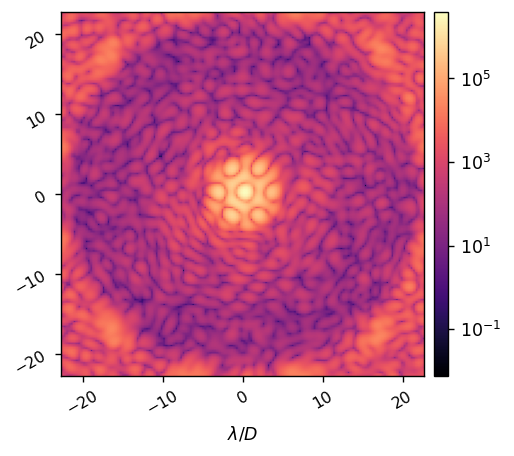

3826008.430443305

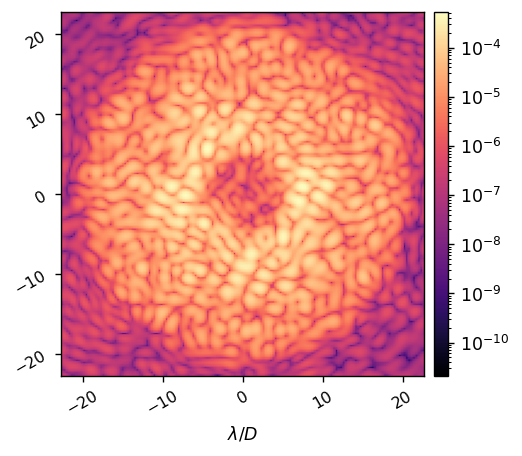

In [2]:
reload(cgi)

source_flux = 2.0208517e8 * u.ph/u.s/u.m**2 # flux of 47 UMa at 575nm with 10% bandpass

c = cgi.CGI(cgi_mode='spc-wide', npsf=150, 
              use_pupil_defocus=True, 
              use_opds=True,
              source_flux=source_flux,
            exp_time=5)

npsf = c.npsf
Nact = c.Nact

c.use_fpm = False
ref_unocc_im = c.snap()
wfsc.imshow1(ref_unocc_im, pxscl=c.psf_pixelscale_lamD, xlabel='$\lambda/D$', lognorm=True)

max_ref = ref_unocc_im.get().max()
display(max_ref)

c.use_fpm = True
c.source_flux = source_flux/max_ref # divide the source flux to get nominal contrast images
ref_im = c.snap()
wfsc.imshow1(ref_im, pxscl=c.psf_pixelscale_lamD, xlabel='$\lambda/D$', lognorm=True)

# Create dark hole ROI to calibrate and control

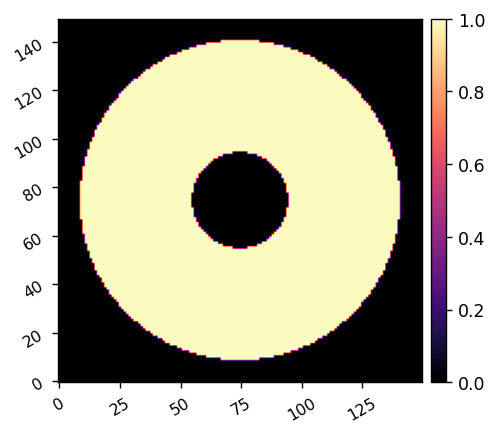

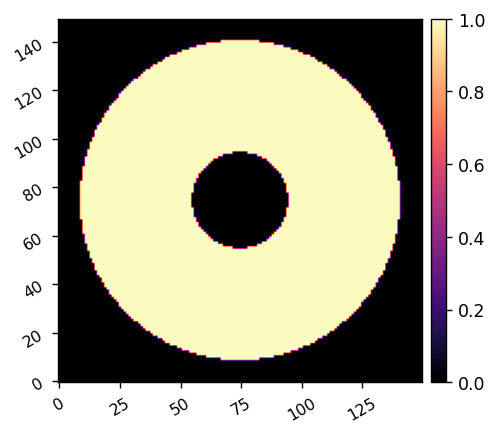

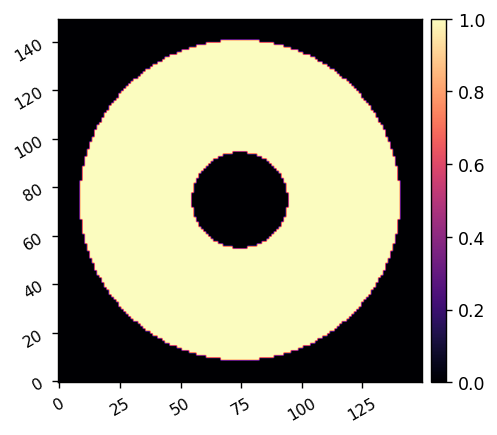

In [5]:
reload(wfsc)
reload(wfsc.utils)
reload(wfsc.imshows)
xfp = (xp.linspace(-npsf/2, npsf/2-1, npsf) + 1/2)*c.psf_pixelscale_lamD
fpx,fpy = xp.meshgrid(xfp,xfp)
  
iwa = 6
owa = 20
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 2,
        'rotation':0,
        'full':True,
    }
roi1 = wfsc.utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)

iwa = 6
owa = 20
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 0,
        'rotation':0,
        'full':True,
    }
roi2 = wfsc.utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)

# wfsc.imshow2(roi1, roi2)
relative_weight = 0.2
weight_map = roi1 + relative_weight*(roi2 * ~roi1)
control_mask = weight_map>0
wfsc.imshow1(weight_map)

probe_amp = 3e-8
calib_amp = 5e-9

# Create probe and fourier modes

(1836, 2304) (918, 2)


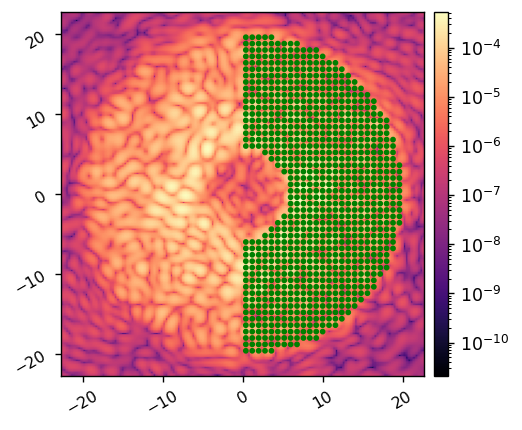

In [7]:
reload(wfsc.utils)
calib_amp = 5e-9
fourier_modes, fs = wfsc.utils.select_fourier_modes(c, control_mask*(fpx>0), fourier_sampling=0.8) 
nmodes = fourier_modes.shape[0]
print(fourier_modes.shape, fs.shape)

patches = []
for f in fs:
    center = (f[0], f[1])
    radius = 0.25
    patches.append(Circle(center, radius, fill=True, color='g'))
    
wfsc.imshow1(ref_im, lognorm=True, pxscl=c.psf_pixelscale_lamD, patches=patches)

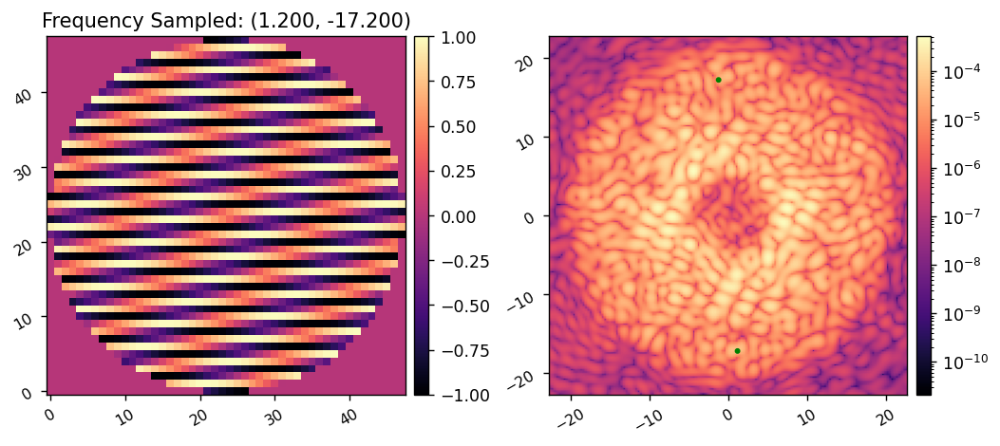

In [9]:
for i in range(fourier_modes.shape[0]//2):
    try:
        wfsc.imshow2(fourier_modes[i].reshape(Nact,Nact), ref_im, 
                       'Frequency Sampled: ({:.3f}, {:.3f})'.format(fs[i][0], fs[i][1]),
                       lognorm2=True,
                       pxscl2=c.psf_pixelscale_lamD, 
                       patches2=[Circle(fs[i], 0.25, fill=True, color='g'),
                                 Circle(-fs[i], 0.25, fill=True, color='g')])
        clear_output(wait=True)
        time.sleep(0.25)
    except KeyboardInterrupt:
        break

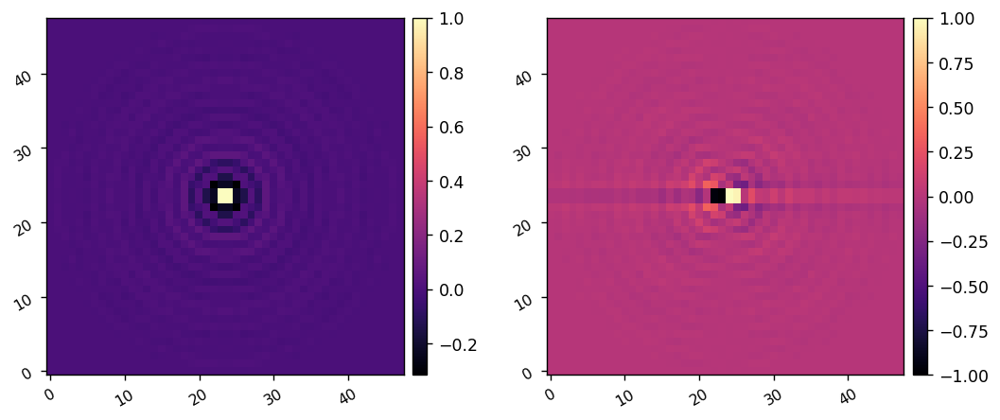

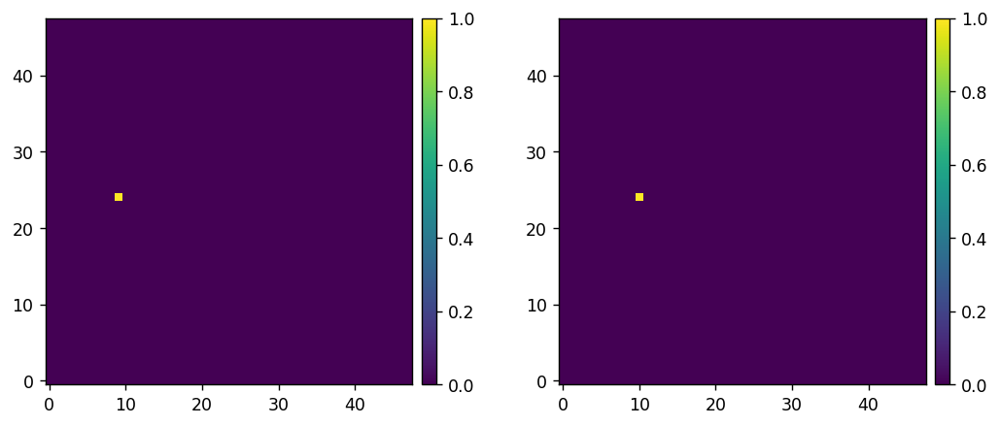

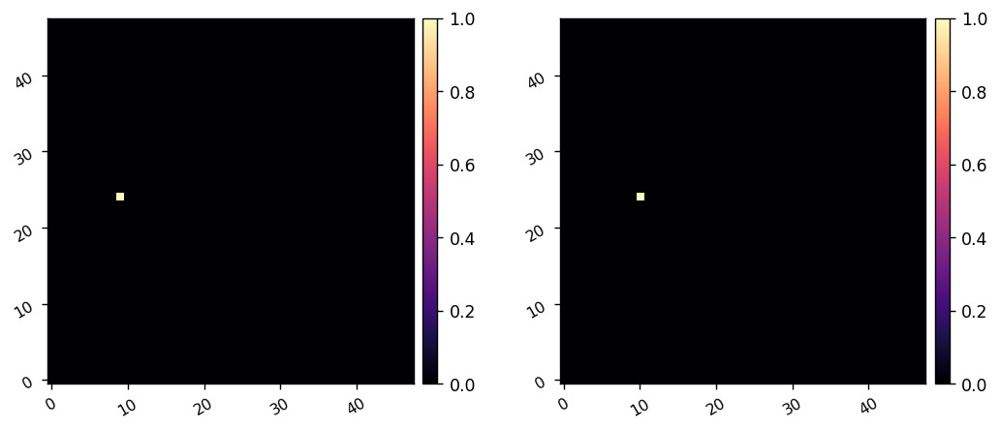

In [12]:
reload(wfsc.utils)
probe_modes_1 = wfsc.utils.create_fourier_probes(fourier_modes, Nact=48, plot=True)

probe_modes_2 = wfsc.utils.create_probe_poke_modes(Nact, 
                                                 poke_indices=[(Nact//5, Nact//2), (Nact//5+1, Nact//2)], 
                                                 plot=True)

probe_modes_3 = probe_modes_1 + probe_modes_2

probe_modes = probe_modes_2
wfsc.imshow2(probe_modes[0], probe_modes[1])

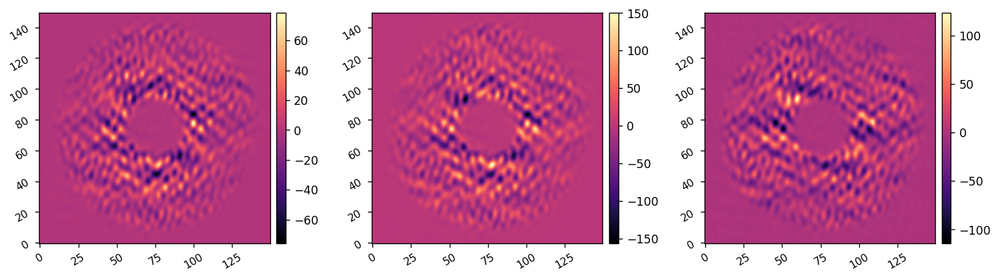

In [14]:
reload(wfsc.iefc)

probe_amp = 5e-8
calib_amp = 5e-9

differential_images, single_images = wfsc.iefc_2dm.take_measurement(c, 
                                                                   probe_modes, probe_amp, 
                                                                   return_all=True)
ims = differential_images.reshape(2, c.npsf, c.npsf)
wfsc.imshow3(ims[0], ims[1], ims[0]-ims[1], wspace=0.35)

# Calibrate IEFC (or load in previous calibration data)

In [15]:
reload(wfsc.iefc_2dm)
response_matrix, response_cube = wfsc.iefc_2dm.calibrate(c, 
                                                         control_mask.ravel(),
                                                         probe_amp, probe_modes, 
                                                         calib_amp, fourier_modes, 
                                                         return_all=True)

Calibrating I-EFC...
	Calibrated mode 1 / 1836 in 5.673s
	Calibrated mode 2 / 1836 in 11.321s
	Calibrated mode 3 / 1836 in 16.978s
	Calibrated mode 4 / 1836 in 22.610s
	Calibrated mode 5 / 1836 in 28.827s
	Calibrated mode 6 / 1836 in 34.491s
	Calibrated mode 7 / 1836 in 40.128s
	Calibrated mode 8 / 1836 in 45.774s
	Calibrated mode 9 / 1836 in 51.411s
	Calibrated mode 10 / 1836 in 57.076s
	Calibrated mode 11 / 1836 in 62.742s
	Calibrated mode 12 / 1836 in 68.402s
	Calibrated mode 13 / 1836 in 74.058s
	Calibrated mode 14 / 1836 in 79.724s
	Calibrated mode 15 / 1836 in 85.374s
	Calibrated mode 16 / 1836 in 91.028s
	Calibrated mode 17 / 1836 in 96.714s
	Calibrated mode 18 / 1836 in 102.470s
	Calibrated mode 19 / 1836 in 108.119s
	Calibrated mode 20 / 1836 in 113.764s
	Calibrated mode 21 / 1836 in 119.416s
	Calibrated mode 22 / 1836 in 125.086s
	Calibrated mode 23 / 1836 in 130.732s
	Calibrated mode 24 / 1836 in 136.372s
	Calibrated mode 25 / 1836 in 142.012s
	Calibrated mode 26 / 1836 in 1

	Calibrated mode 208 / 1836 in 1176.180s
	Calibrated mode 209 / 1836 in 1181.817s
	Calibrated mode 210 / 1836 in 1187.453s
	Calibrated mode 211 / 1836 in 1193.086s
	Calibrated mode 212 / 1836 in 1198.717s
	Calibrated mode 213 / 1836 in 1204.350s
	Calibrated mode 214 / 1836 in 1209.985s
	Calibrated mode 215 / 1836 in 1215.618s
	Calibrated mode 216 / 1836 in 1221.366s
	Calibrated mode 217 / 1836 in 1226.998s
	Calibrated mode 218 / 1836 in 1232.635s
	Calibrated mode 219 / 1836 in 1238.271s
	Calibrated mode 220 / 1836 in 1243.905s
	Calibrated mode 221 / 1836 in 1249.535s
	Calibrated mode 222 / 1836 in 1255.169s
	Calibrated mode 223 / 1836 in 1260.802s
	Calibrated mode 224 / 1836 in 1266.437s
	Calibrated mode 225 / 1836 in 1272.070s
	Calibrated mode 226 / 1836 in 1277.709s
	Calibrated mode 227 / 1836 in 1283.445s
	Calibrated mode 228 / 1836 in 1289.075s
	Calibrated mode 229 / 1836 in 1294.711s
	Calibrated mode 230 / 1836 in 1300.340s
	Calibrated mode 231 / 1836 in 1305.976s
	Calibrated mode

	Calibrated mode 408 / 1836 in 2305.501s
	Calibrated mode 409 / 1836 in 2311.149s
	Calibrated mode 410 / 1836 in 2316.794s
	Calibrated mode 411 / 1836 in 2322.438s
	Calibrated mode 412 / 1836 in 2328.083s
	Calibrated mode 413 / 1836 in 2333.728s
	Calibrated mode 414 / 1836 in 2339.387s
	Calibrated mode 415 / 1836 in 2345.032s
	Calibrated mode 416 / 1836 in 2350.789s
	Calibrated mode 417 / 1836 in 2356.434s
	Calibrated mode 418 / 1836 in 2362.079s
	Calibrated mode 419 / 1836 in 2367.723s
	Calibrated mode 420 / 1836 in 2373.365s
	Calibrated mode 421 / 1836 in 2379.018s
	Calibrated mode 422 / 1836 in 2384.667s
	Calibrated mode 423 / 1836 in 2390.314s
	Calibrated mode 424 / 1836 in 2395.963s
	Calibrated mode 425 / 1836 in 2401.615s
	Calibrated mode 426 / 1836 in 2407.263s
	Calibrated mode 427 / 1836 in 2413.021s
	Calibrated mode 428 / 1836 in 2418.677s
	Calibrated mode 429 / 1836 in 2424.328s
	Calibrated mode 430 / 1836 in 2429.976s
	Calibrated mode 431 / 1836 in 2435.623s
	Calibrated mode

	Calibrated mode 608 / 1836 in 3439.849s
	Calibrated mode 609 / 1836 in 3445.506s
	Calibrated mode 610 / 1836 in 3451.173s
	Calibrated mode 611 / 1836 in 3456.829s
	Calibrated mode 612 / 1836 in 3462.477s
	Calibrated mode 613 / 1836 in 3468.154s
	Calibrated mode 614 / 1836 in 3473.809s
	Calibrated mode 615 / 1836 in 3479.489s
	Calibrated mode 616 / 1836 in 3485.275s
	Calibrated mode 617 / 1836 in 3490.928s
	Calibrated mode 618 / 1836 in 3496.577s
	Calibrated mode 619 / 1836 in 3502.210s
	Calibrated mode 620 / 1836 in 3507.845s
	Calibrated mode 621 / 1836 in 3513.478s
	Calibrated mode 622 / 1836 in 3519.133s
	Calibrated mode 623 / 1836 in 3524.768s
	Calibrated mode 624 / 1836 in 3530.404s
	Calibrated mode 625 / 1836 in 3536.040s
	Calibrated mode 626 / 1836 in 3541.676s
	Calibrated mode 627 / 1836 in 3547.309s
	Calibrated mode 628 / 1836 in 3553.047s
	Calibrated mode 629 / 1836 in 3558.677s
	Calibrated mode 630 / 1836 in 3564.307s
	Calibrated mode 631 / 1836 in 3569.935s
	Calibrated mode

	Calibrated mode 808 / 1836 in 4569.123s
	Calibrated mode 809 / 1836 in 4574.754s
	Calibrated mode 810 / 1836 in 4580.398s
	Calibrated mode 811 / 1836 in 4586.036s
	Calibrated mode 812 / 1836 in 4591.678s
	Calibrated mode 813 / 1836 in 4597.317s
	Calibrated mode 814 / 1836 in 4602.945s
	Calibrated mode 815 / 1836 in 4608.578s
	Calibrated mode 816 / 1836 in 4614.214s
	Calibrated mode 817 / 1836 in 4619.851s
	Calibrated mode 818 / 1836 in 4625.493s
	Calibrated mode 819 / 1836 in 4631.234s
	Calibrated mode 820 / 1836 in 4636.865s
	Calibrated mode 821 / 1836 in 4642.501s
	Calibrated mode 822 / 1836 in 4648.139s
	Calibrated mode 823 / 1836 in 4653.773s
	Calibrated mode 824 / 1836 in 4659.402s
	Calibrated mode 825 / 1836 in 4665.034s
	Calibrated mode 826 / 1836 in 4670.667s
	Calibrated mode 827 / 1836 in 4676.305s
	Calibrated mode 828 / 1836 in 4681.944s
	Calibrated mode 829 / 1836 in 4687.579s
	Calibrated mode 830 / 1836 in 4693.317s
	Calibrated mode 831 / 1836 in 4698.944s
	Calibrated mode

	Calibrated mode 1008 / 1836 in 5702.231s
	Calibrated mode 1009 / 1836 in 5707.890s
	Calibrated mode 1010 / 1836 in 5713.556s
	Calibrated mode 1011 / 1836 in 5719.214s
	Calibrated mode 1012 / 1836 in 5724.978s
	Calibrated mode 1013 / 1836 in 5730.631s
	Calibrated mode 1014 / 1836 in 5736.286s
	Calibrated mode 1015 / 1836 in 5741.947s
	Calibrated mode 1016 / 1836 in 5747.612s
	Calibrated mode 1017 / 1836 in 5753.271s
	Calibrated mode 1018 / 1836 in 5758.926s
	Calibrated mode 1019 / 1836 in 5764.617s
	Calibrated mode 1020 / 1836 in 5770.276s
	Calibrated mode 1021 / 1836 in 5775.942s
	Calibrated mode 1022 / 1836 in 5781.602s
	Calibrated mode 1023 / 1836 in 5787.369s
	Calibrated mode 1024 / 1836 in 5793.035s
	Calibrated mode 1025 / 1836 in 5798.718s
	Calibrated mode 1026 / 1836 in 5804.375s
	Calibrated mode 1027 / 1836 in 5810.026s
	Calibrated mode 1028 / 1836 in 5815.682s
	Calibrated mode 1029 / 1836 in 5821.337s
	Calibrated mode 1030 / 1836 in 5827.059s
	Calibrated mode 1031 / 1836 in 58

	Calibrated mode 1204 / 1836 in 6844.265s
	Calibrated mode 1205 / 1836 in 6849.918s
	Calibrated mode 1206 / 1836 in 6855.687s
	Calibrated mode 1207 / 1836 in 6861.342s
	Calibrated mode 1208 / 1836 in 6866.989s
	Calibrated mode 1209 / 1836 in 6872.639s
	Calibrated mode 1210 / 1836 in 6878.291s
	Calibrated mode 1211 / 1836 in 6883.944s
	Calibrated mode 1212 / 1836 in 6889.595s
	Calibrated mode 1213 / 1836 in 6895.243s
	Calibrated mode 1214 / 1836 in 6900.893s
	Calibrated mode 1215 / 1836 in 6906.543s
	Calibrated mode 1216 / 1836 in 6912.188s
	Calibrated mode 1217 / 1836 in 6917.958s
	Calibrated mode 1218 / 1836 in 6923.607s
	Calibrated mode 1219 / 1836 in 6929.250s
	Calibrated mode 1220 / 1836 in 6934.901s
	Calibrated mode 1221 / 1836 in 6940.545s
	Calibrated mode 1222 / 1836 in 6946.188s
	Calibrated mode 1223 / 1836 in 6951.832s
	Calibrated mode 1224 / 1836 in 6957.492s
	Calibrated mode 1225 / 1836 in 6963.139s
	Calibrated mode 1226 / 1836 in 6968.790s
	Calibrated mode 1227 / 1836 in 69

	Calibrated mode 1400 / 1836 in 7954.752s
	Calibrated mode 1401 / 1836 in 7960.412s
	Calibrated mode 1402 / 1836 in 7966.178s
	Calibrated mode 1403 / 1836 in 7971.827s
	Calibrated mode 1404 / 1836 in 7977.479s
	Calibrated mode 1405 / 1836 in 7983.133s
	Calibrated mode 1406 / 1836 in 7988.784s
	Calibrated mode 1407 / 1836 in 7994.440s
	Calibrated mode 1408 / 1836 in 8000.091s
	Calibrated mode 1409 / 1836 in 8005.752s
	Calibrated mode 1410 / 1836 in 8011.411s
	Calibrated mode 1411 / 1836 in 8017.069s
	Calibrated mode 1412 / 1836 in 8022.734s
	Calibrated mode 1413 / 1836 in 8028.511s
	Calibrated mode 1414 / 1836 in 8034.161s
	Calibrated mode 1415 / 1836 in 8039.811s
	Calibrated mode 1416 / 1836 in 8045.461s
	Calibrated mode 1417 / 1836 in 8051.115s
	Calibrated mode 1418 / 1836 in 8056.771s
	Calibrated mode 1419 / 1836 in 8062.428s
	Calibrated mode 1420 / 1836 in 8068.089s
	Calibrated mode 1421 / 1836 in 8073.744s
	Calibrated mode 1422 / 1836 in 8079.400s
	Calibrated mode 1423 / 1836 in 80

	Calibrated mode 1596 / 1836 in 9064.667s
	Calibrated mode 1597 / 1836 in 9070.318s
	Calibrated mode 1598 / 1836 in 9076.043s
	Calibrated mode 1599 / 1836 in 9081.817s
	Calibrated mode 1600 / 1836 in 9087.469s
	Calibrated mode 1601 / 1836 in 9093.125s
	Calibrated mode 1602 / 1836 in 9098.780s
	Calibrated mode 1603 / 1836 in 9104.433s
	Calibrated mode 1604 / 1836 in 9110.084s
	Calibrated mode 1605 / 1836 in 9115.741s
	Calibrated mode 1606 / 1836 in 9121.409s
	Calibrated mode 1607 / 1836 in 9127.062s
	Calibrated mode 1608 / 1836 in 9132.715s
	Calibrated mode 1609 / 1836 in 9138.368s
	Calibrated mode 1610 / 1836 in 9144.021s
	Calibrated mode 1611 / 1836 in 9149.796s
	Calibrated mode 1612 / 1836 in 9155.449s
	Calibrated mode 1613 / 1836 in 9161.101s
	Calibrated mode 1614 / 1836 in 9166.761s
	Calibrated mode 1615 / 1836 in 9172.406s
	Calibrated mode 1616 / 1836 in 9178.035s
	Calibrated mode 1617 / 1836 in 9183.670s
	Calibrated mode 1618 / 1836 in 9189.322s
	Calibrated mode 1619 / 1836 in 91

	Calibrated mode 1791 / 1836 in 10168.583s
	Calibrated mode 1792 / 1836 in 10174.236s
	Calibrated mode 1793 / 1836 in 10179.894s
	Calibrated mode 1794 / 1836 in 10185.547s
	Calibrated mode 1795 / 1836 in 10191.191s
	Calibrated mode 1796 / 1836 in 10196.845s
	Calibrated mode 1797 / 1836 in 10202.494s
	Calibrated mode 1798 / 1836 in 10208.253s
	Calibrated mode 1799 / 1836 in 10213.897s
	Calibrated mode 1800 / 1836 in 10219.548s
	Calibrated mode 1801 / 1836 in 10225.186s
	Calibrated mode 1802 / 1836 in 10230.841s
	Calibrated mode 1803 / 1836 in 10236.499s
	Calibrated mode 1804 / 1836 in 10242.157s
	Calibrated mode 1805 / 1836 in 10247.808s
	Calibrated mode 1806 / 1836 in 10253.458s
	Calibrated mode 1807 / 1836 in 10259.115s
	Calibrated mode 1808 / 1836 in 10264.771s
	Calibrated mode 1809 / 1836 in 10270.429s
	Calibrated mode 1810 / 1836 in 10276.196s
	Calibrated mode 1811 / 1836 in 10281.843s
	Calibrated mode 1812 / 1836 in 10287.503s
	Calibrated mode 1813 / 1836 in 10293.157s
	Calibrated

In [16]:
import misc_funs as misc

misc.save_fits(iefc_dir/'response-data'/'spcwide_iefc_2dm_response_matrix_20230522.fits', 
               wfsc.utils.ensure_np_array(response_matrix))
misc.save_fits(iefc_dir/'response-data'/'spcwide_iefc_2dm_response_cube_20230522.fits', 
               wfsc.utils.ensure_np_array(response_cube))

Saved data to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/response-data/spcwide_iefc_2dm_response_matrix_20230522.fits
Saved data to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/response-data/spcwide_iefc_2dm_response_cube_20230522.fits


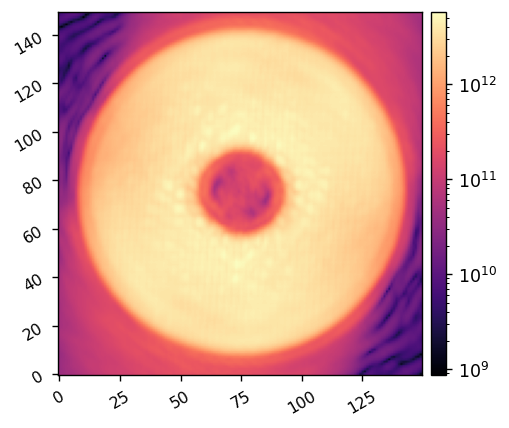

In [17]:
response_sum = xp.sum(abs(response_cube), axis=(0,1))
wfsc.imshow1(response_sum.reshape(npsf, npsf), lognorm=True)

In [16]:
response_cube = misc.load_pickle(iefc_dir/'response-data'/fname)
# calibration_cube = misc.load_pickle(iefc_dir/'calibration-data'/fname)

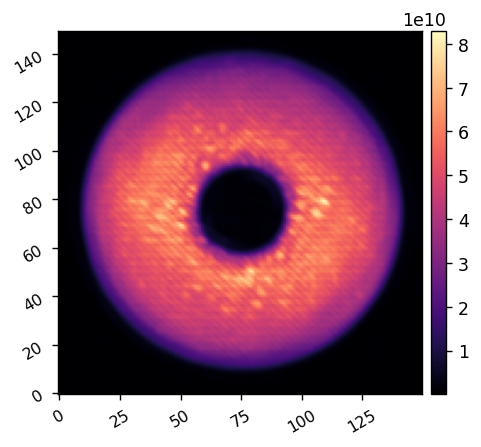

In [11]:
response_sum = np.sum(abs(response_cube), axis=(0,1))
misc.myimshow(response_sum.reshape(sysi.npsf,sysi.npsf))

# Run IEFC

Running I-EFC...
	Closed-loop iteration 1 / 10


(3672,)

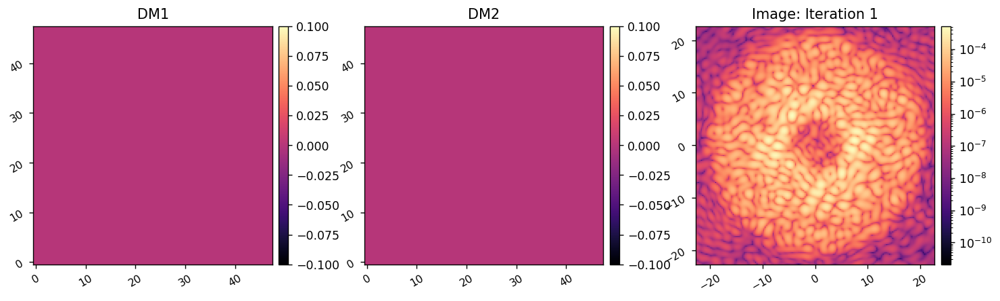

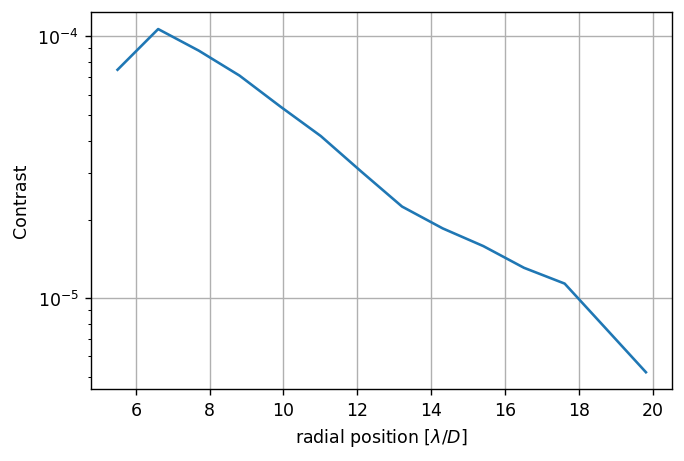

	Closed-loop iteration 2 / 10


(3672,)

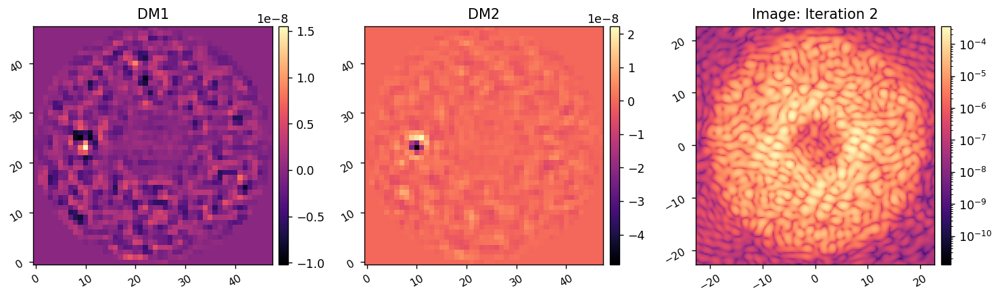

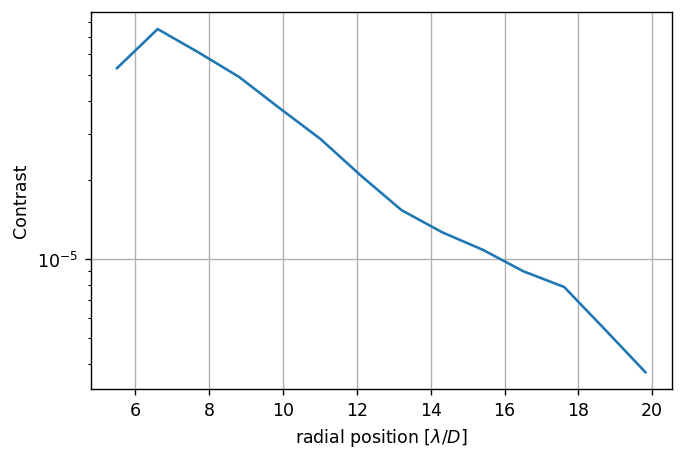

	Closed-loop iteration 3 / 10


(3672,)

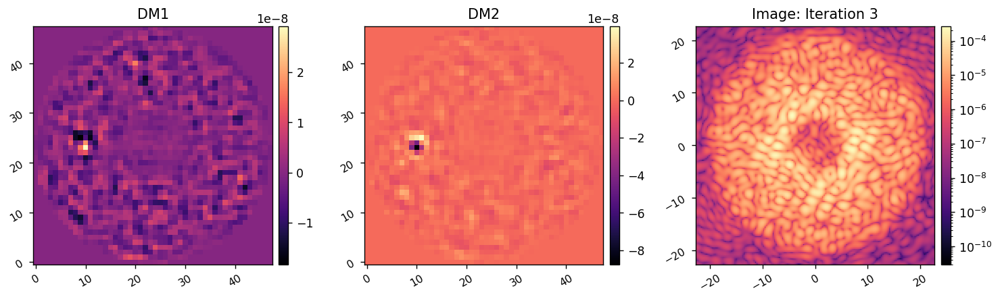

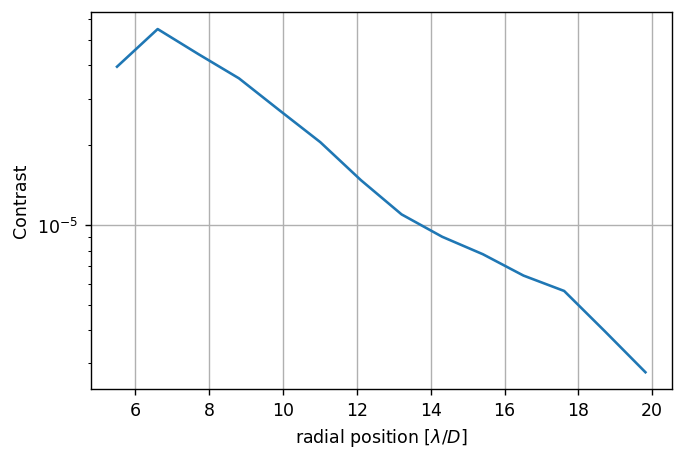

	Closed-loop iteration 4 / 10


(3672,)

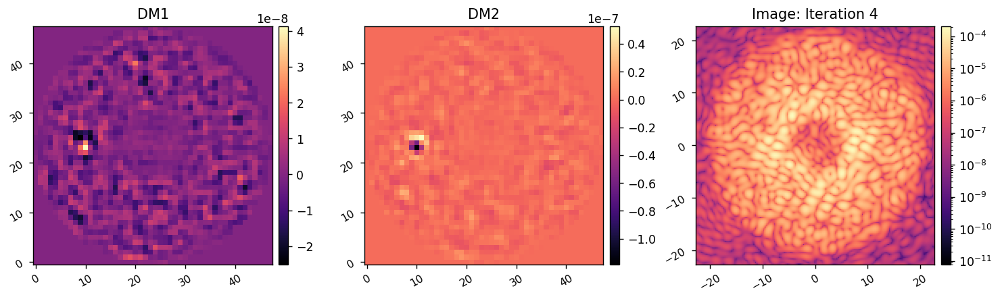

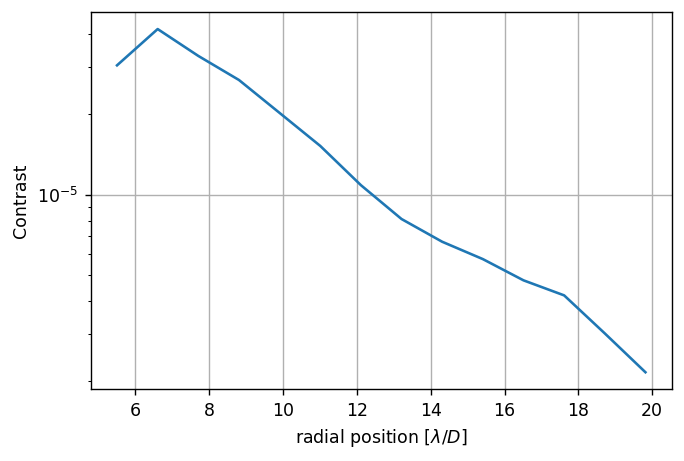

	Closed-loop iteration 5 / 10


(3672,)

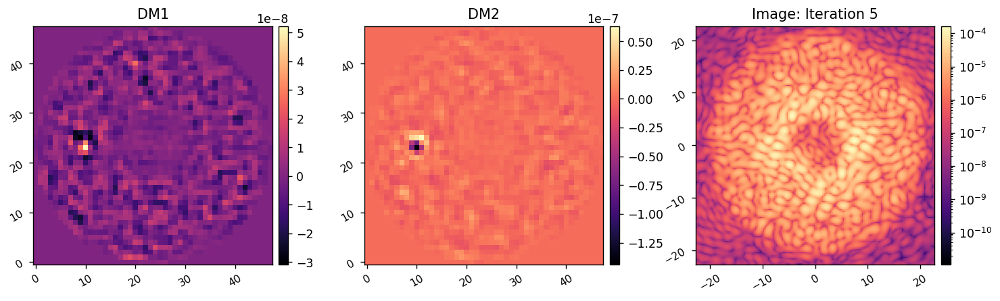

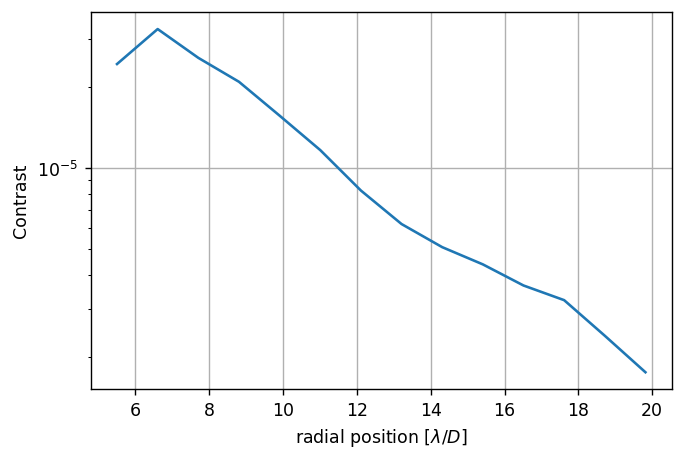

	Closed-loop iteration 6 / 10


(3672,)

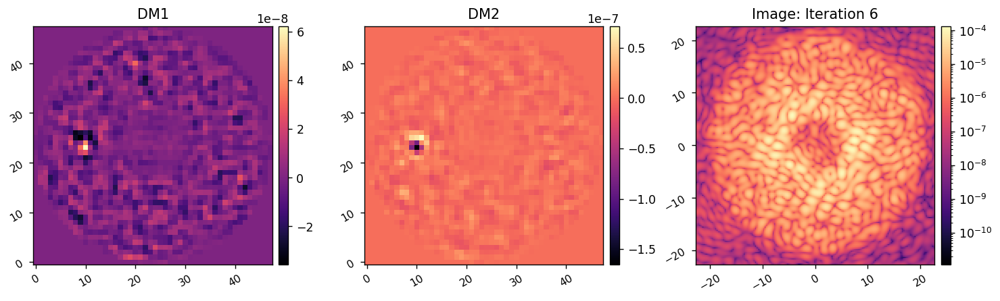

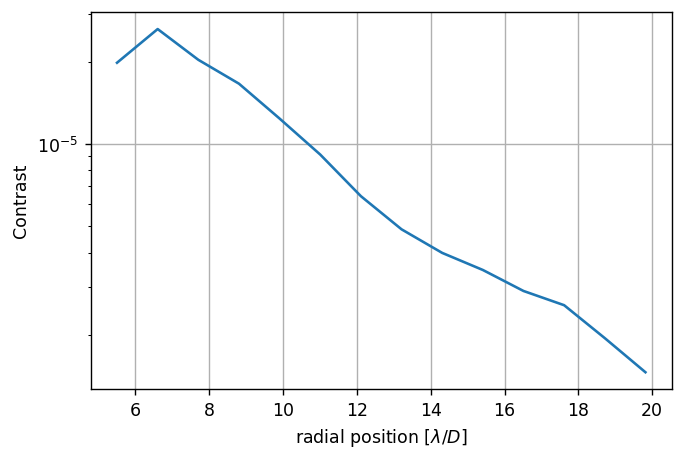

	Closed-loop iteration 7 / 10


(3672,)

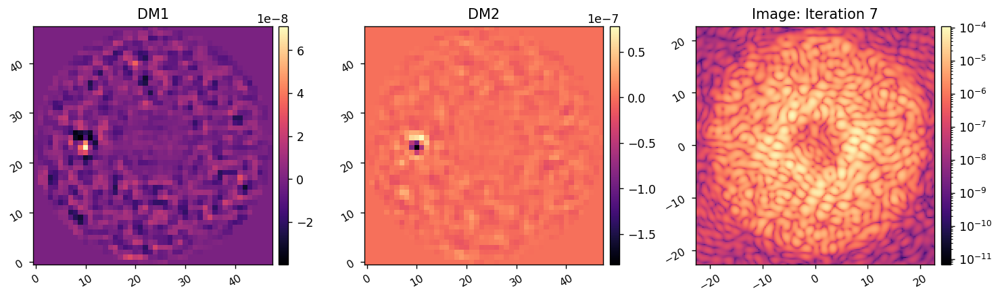

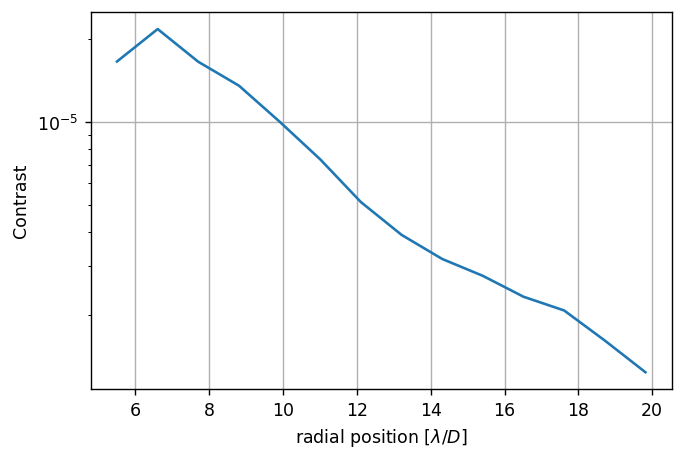

	Closed-loop iteration 8 / 10


(3672,)

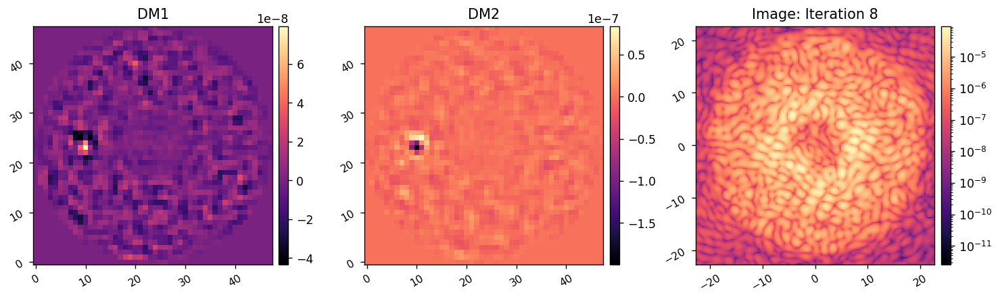

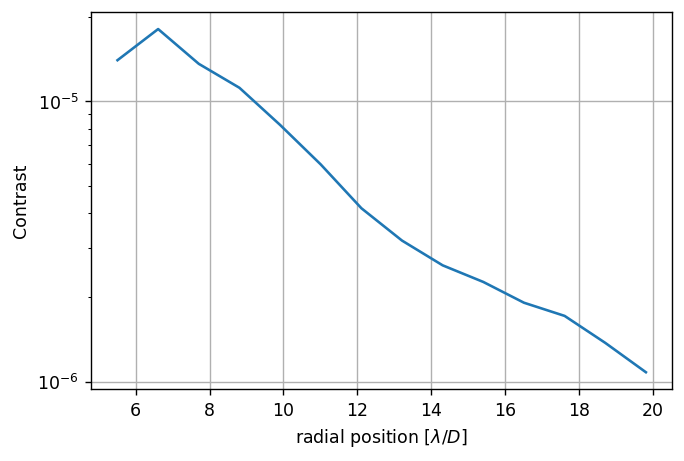

	Closed-loop iteration 9 / 10


(3672,)

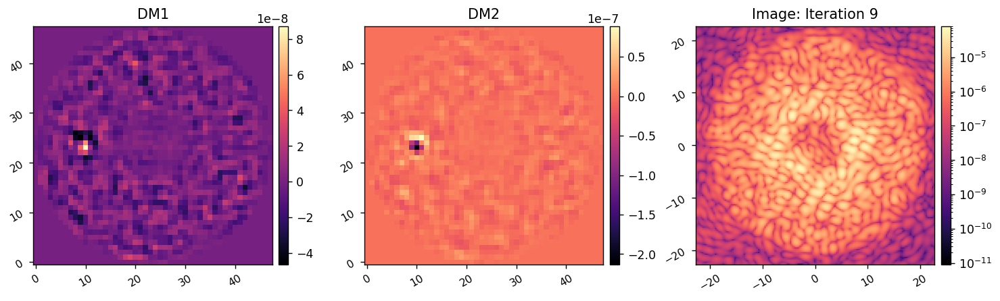

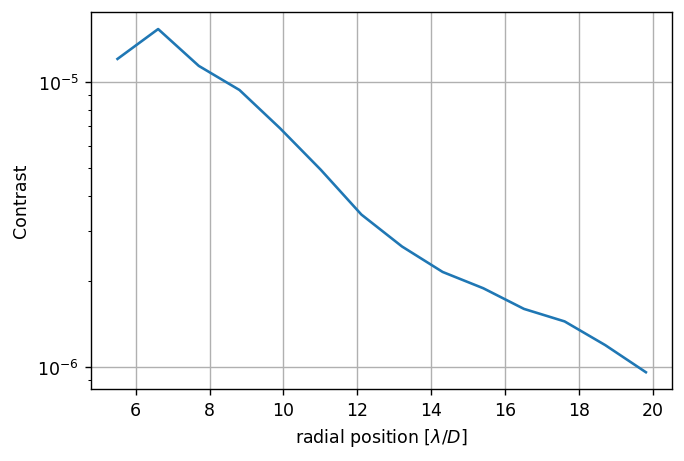

	Closed-loop iteration 10 / 10


(3672,)

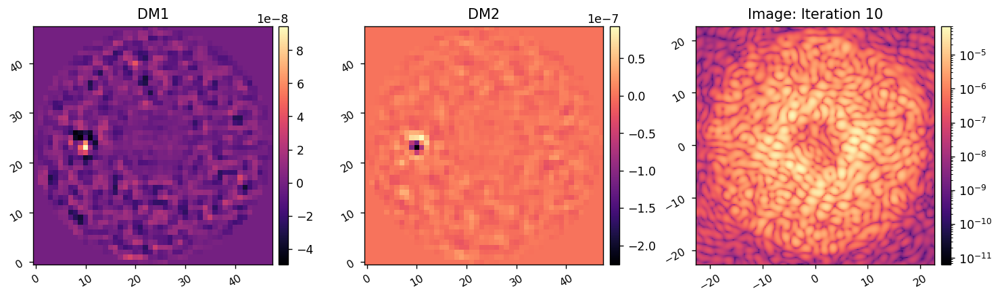

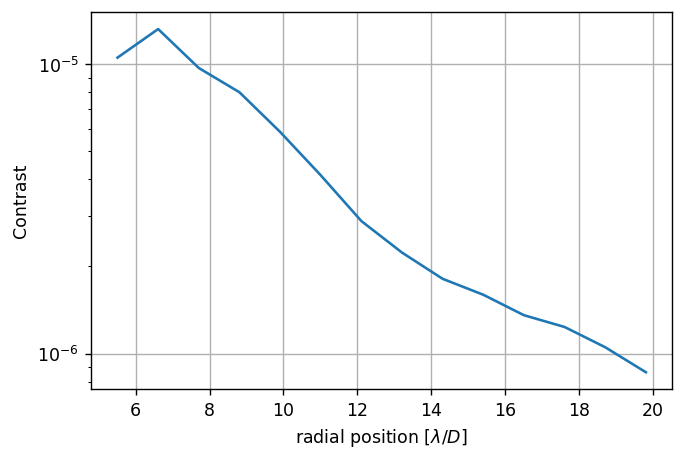

I-EFC loop completed in 27.569s.
Running I-EFC...
	Closed-loop iteration 1 / 20


(3672,)

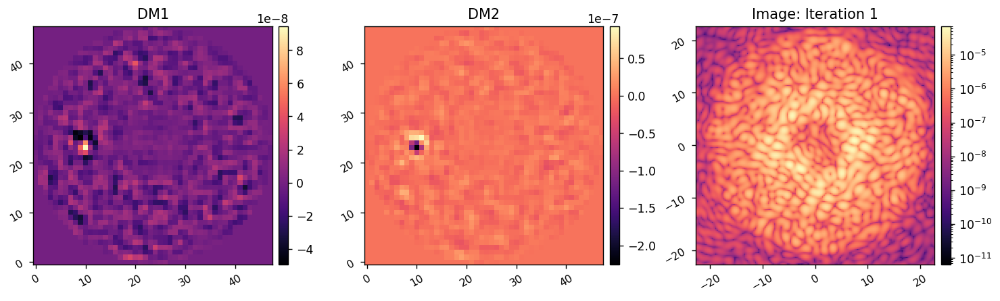

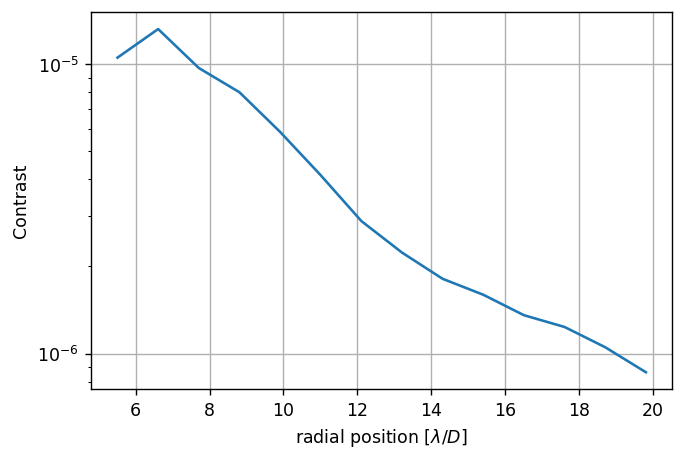

	Closed-loop iteration 2 / 20


(3672,)

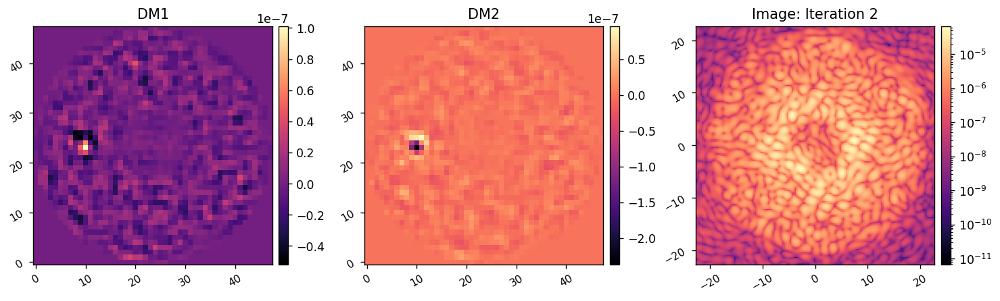

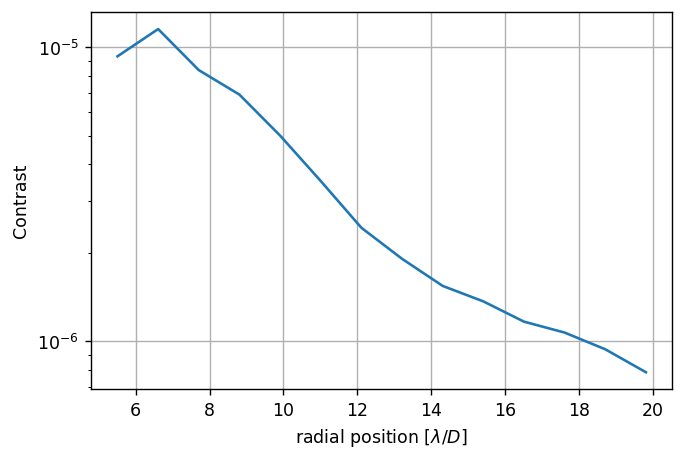

	Closed-loop iteration 3 / 20


(3672,)

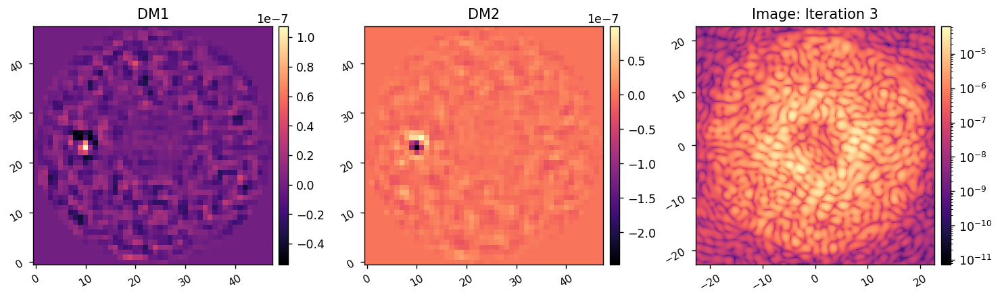

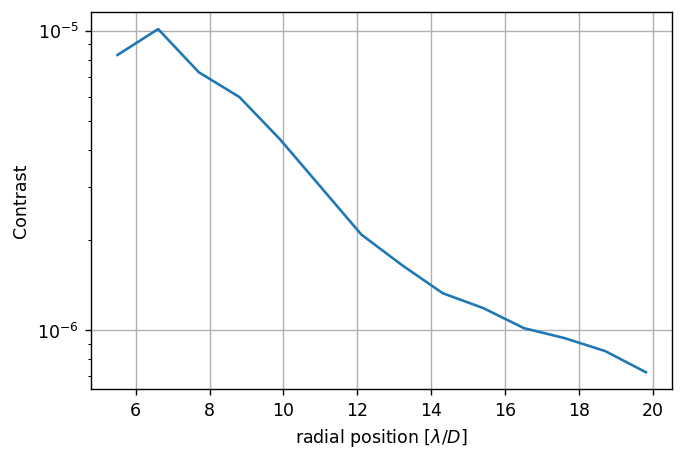

	Closed-loop iteration 4 / 20


(3672,)

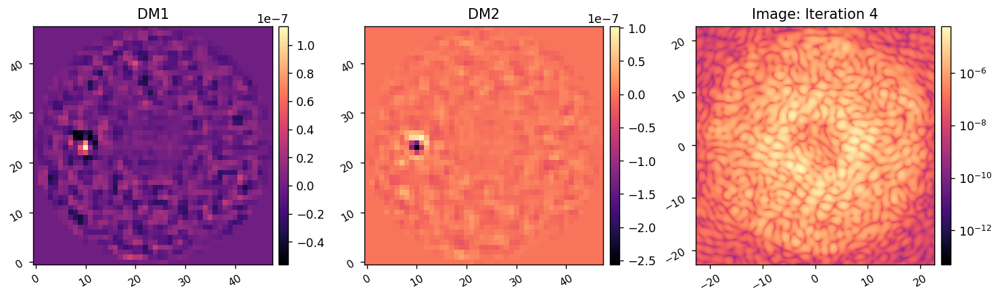

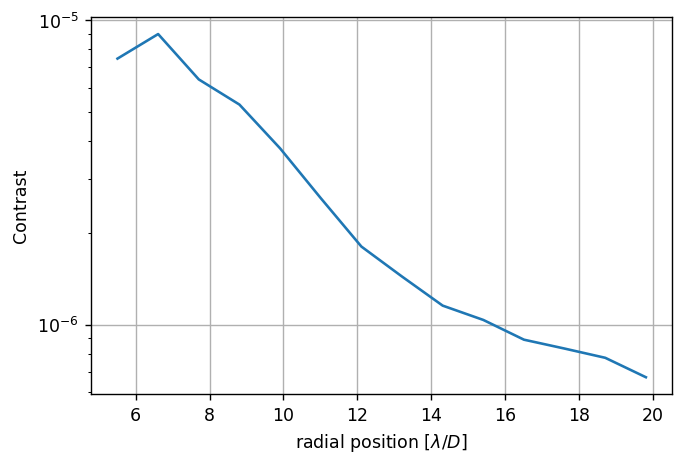

	Closed-loop iteration 5 / 20


(3672,)

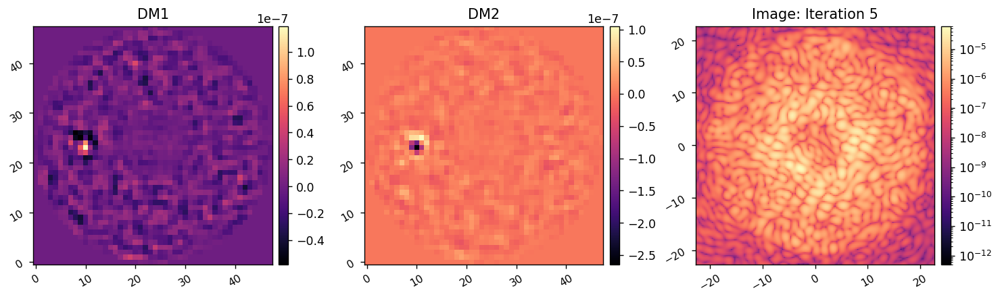

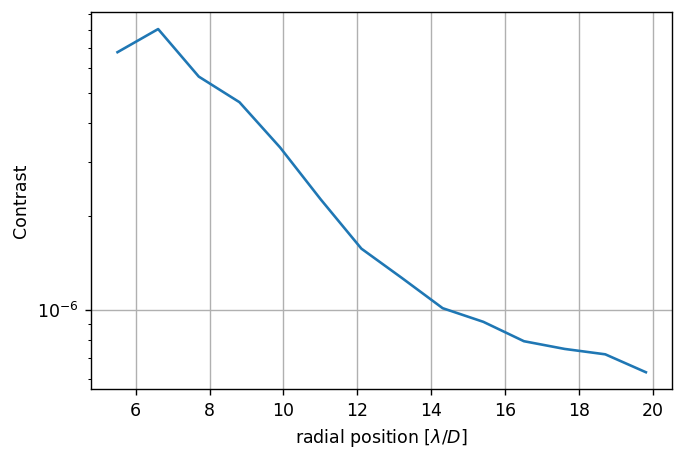

	Closed-loop iteration 6 / 20


(3672,)

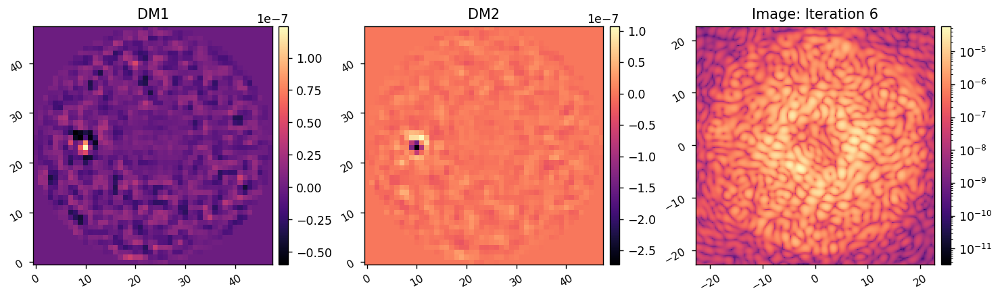

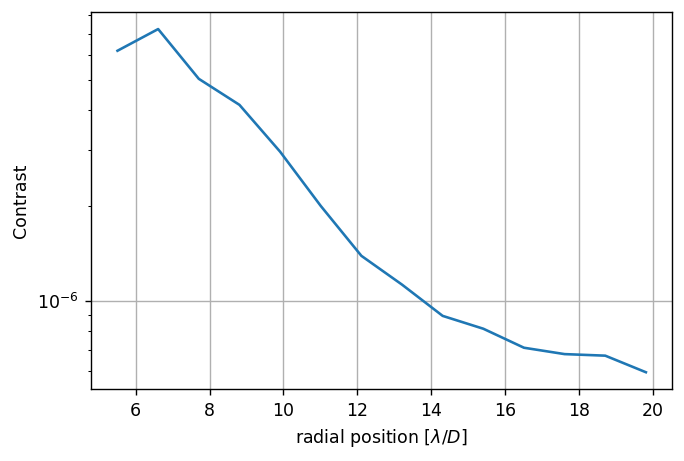

	Closed-loop iteration 7 / 20


(3672,)

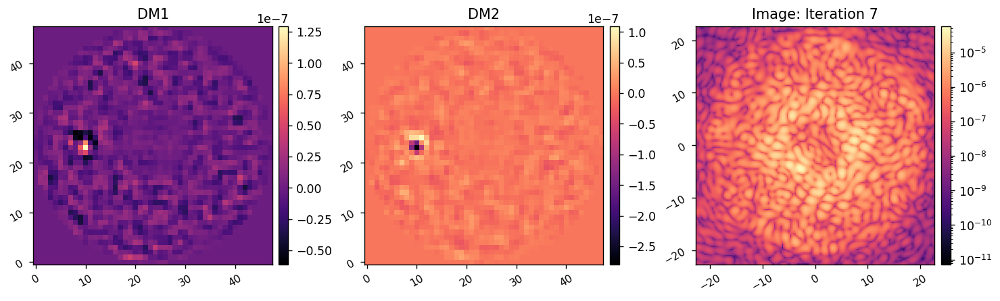

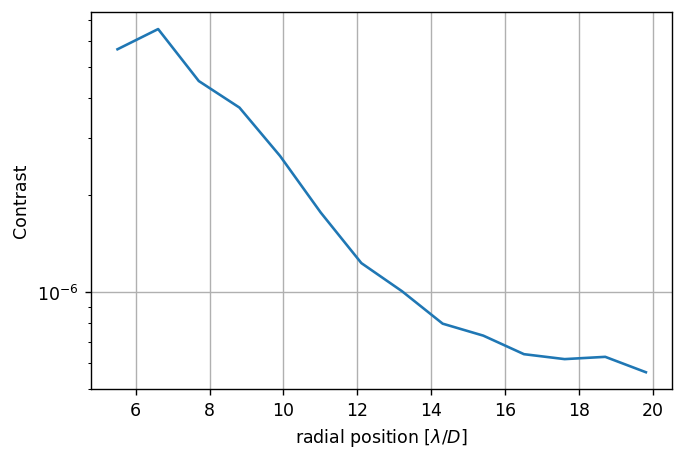

	Closed-loop iteration 8 / 20


(3672,)

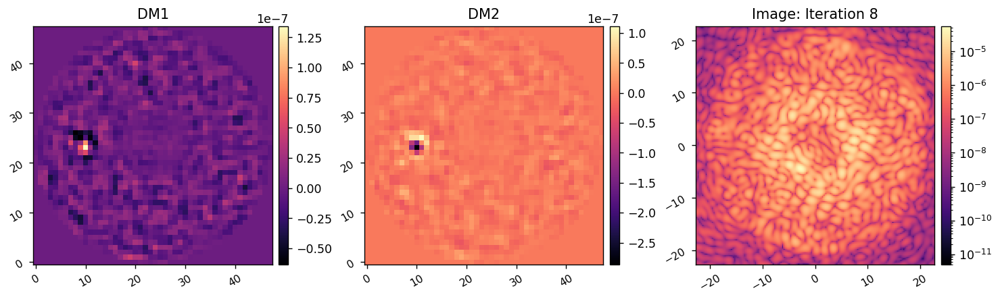

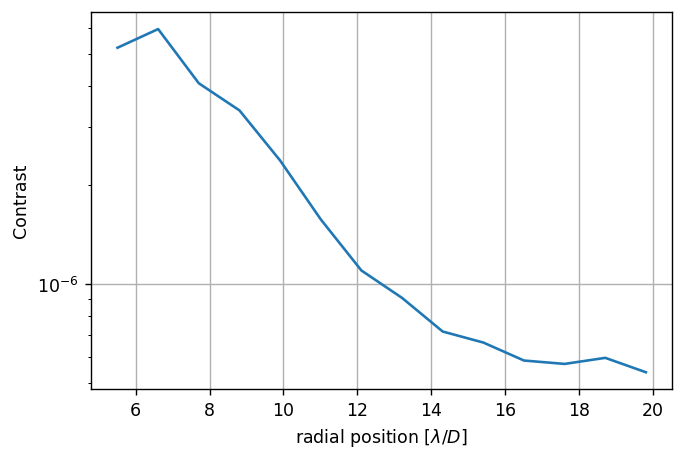

	Closed-loop iteration 9 / 20


(3672,)

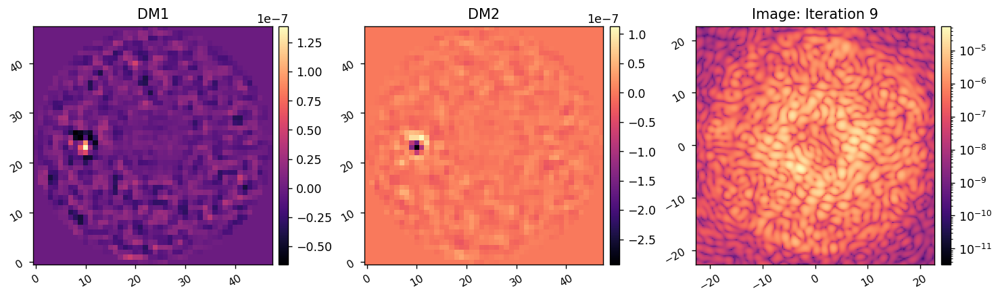

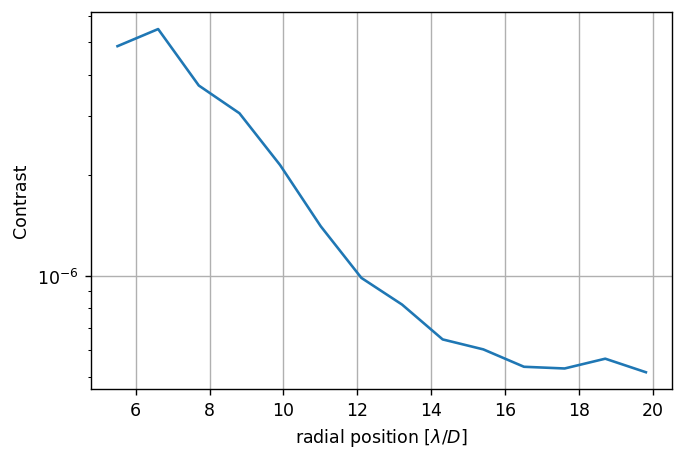

	Closed-loop iteration 10 / 20


(3672,)

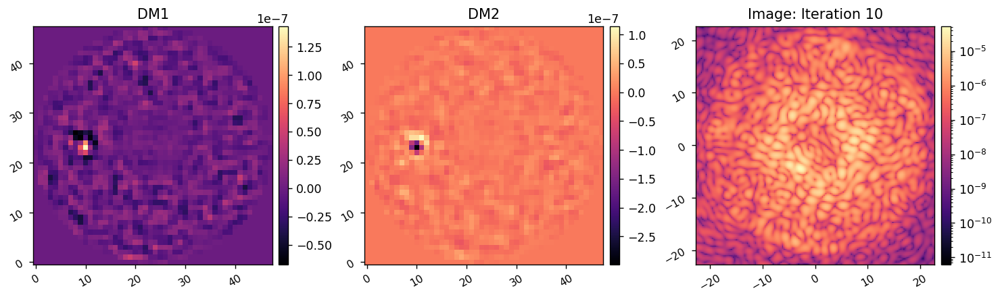

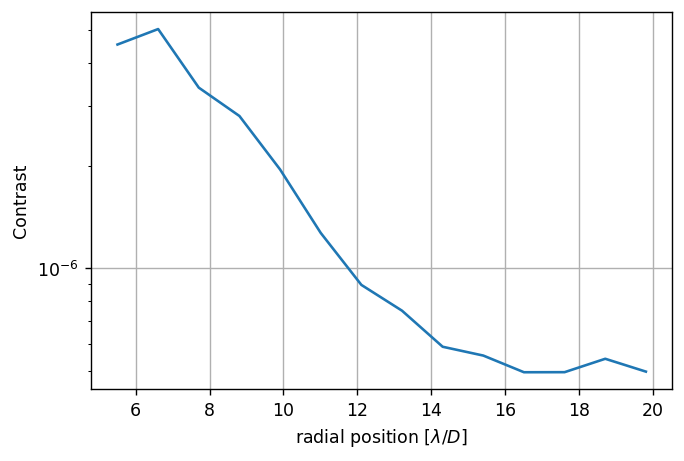

	Closed-loop iteration 11 / 20


(3672,)

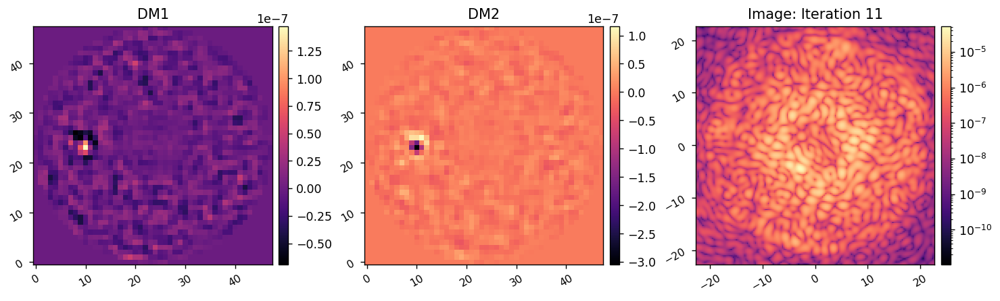

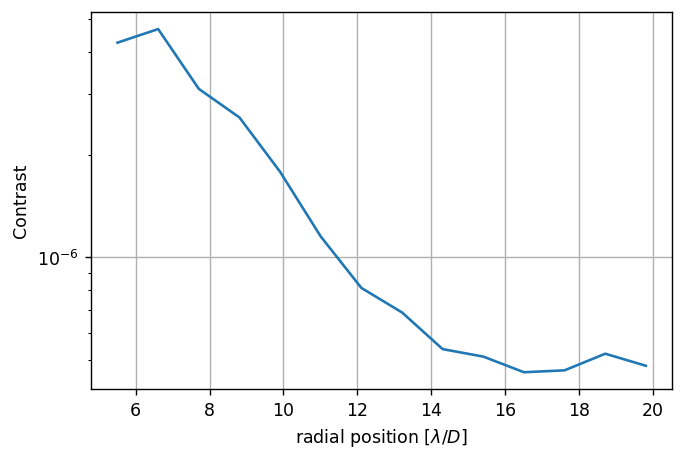

	Closed-loop iteration 12 / 20


(3672,)

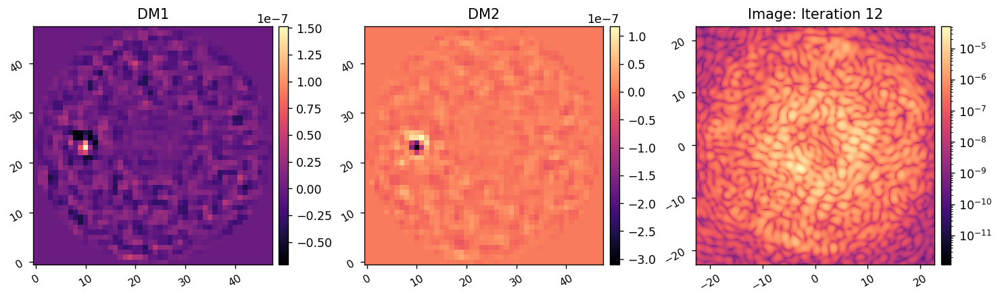

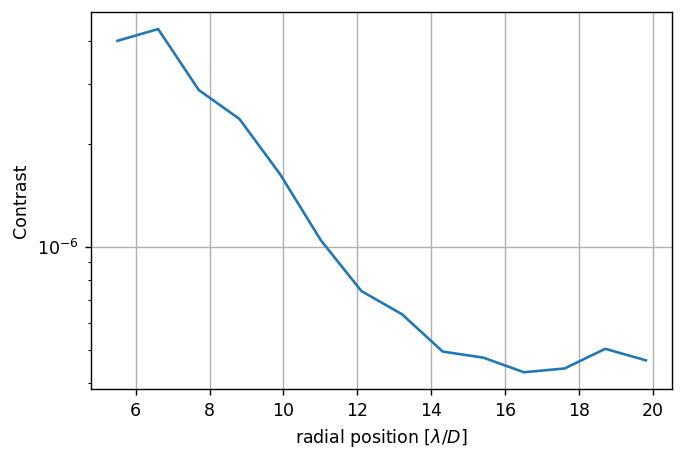

	Closed-loop iteration 13 / 20


(3672,)

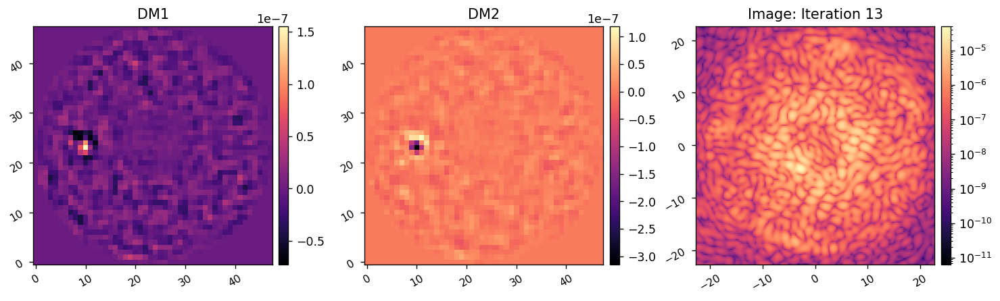

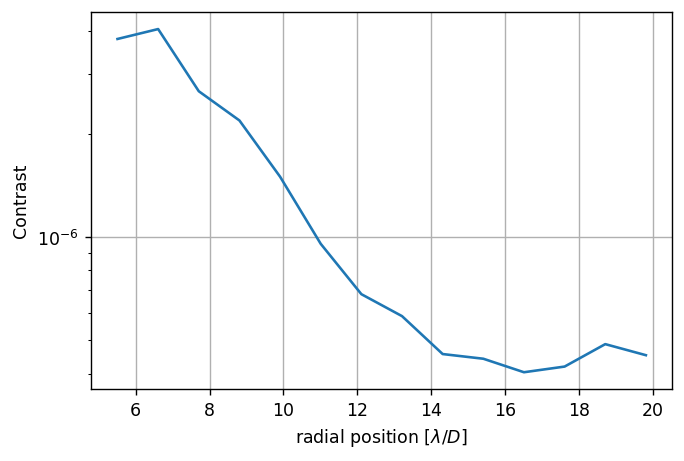

	Closed-loop iteration 14 / 20


(3672,)

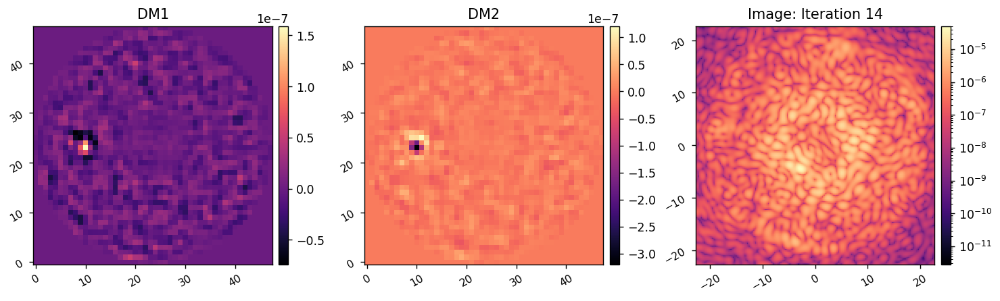

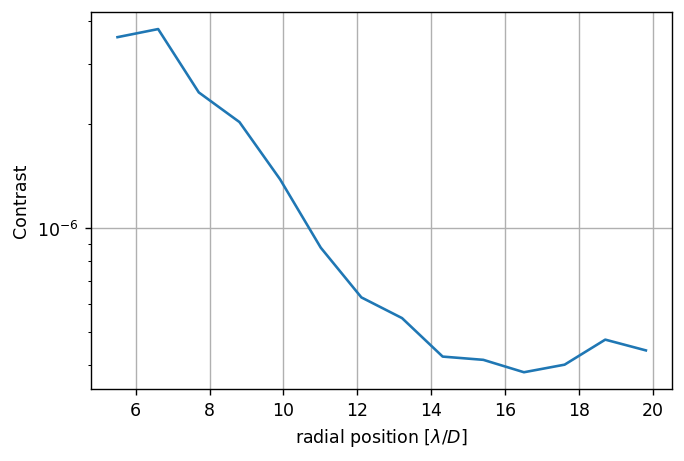

	Closed-loop iteration 15 / 20


(3672,)

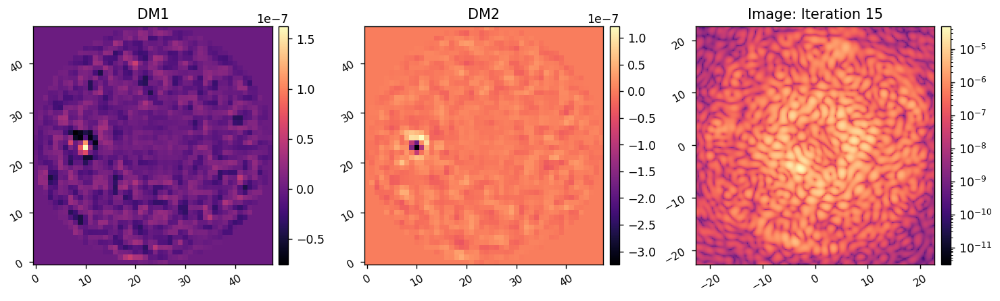

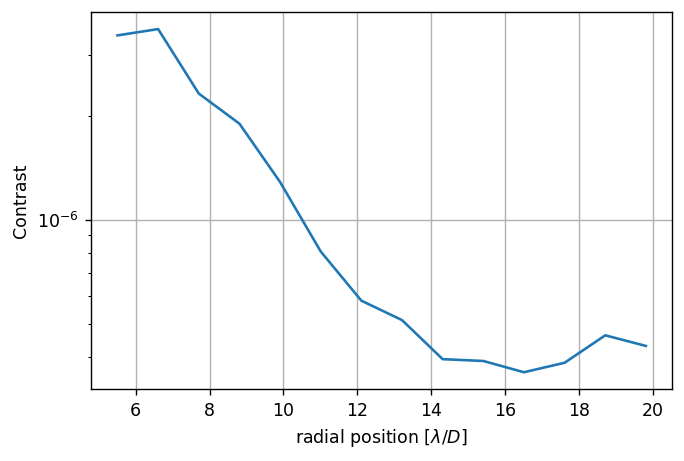

	Closed-loop iteration 16 / 20


(3672,)

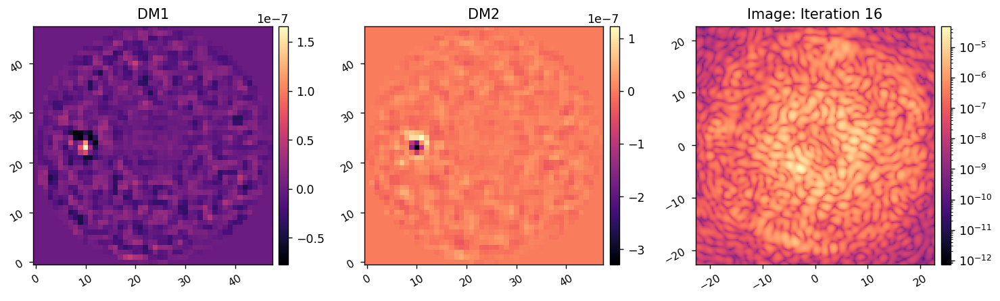

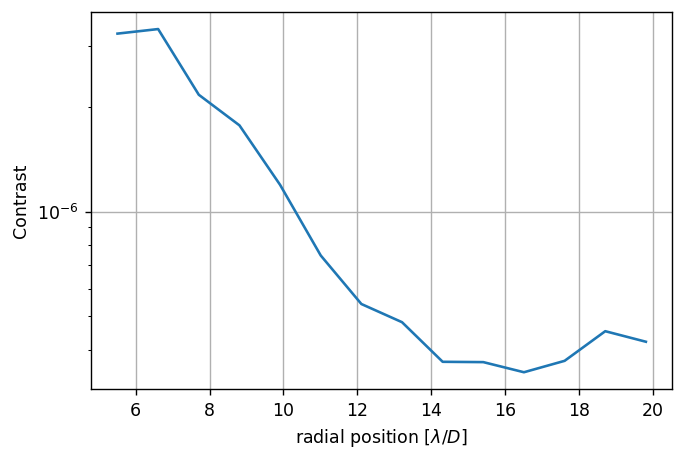

	Closed-loop iteration 17 / 20


(3672,)

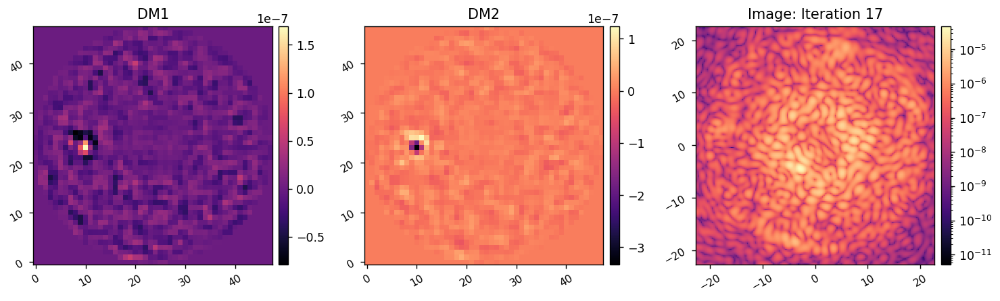

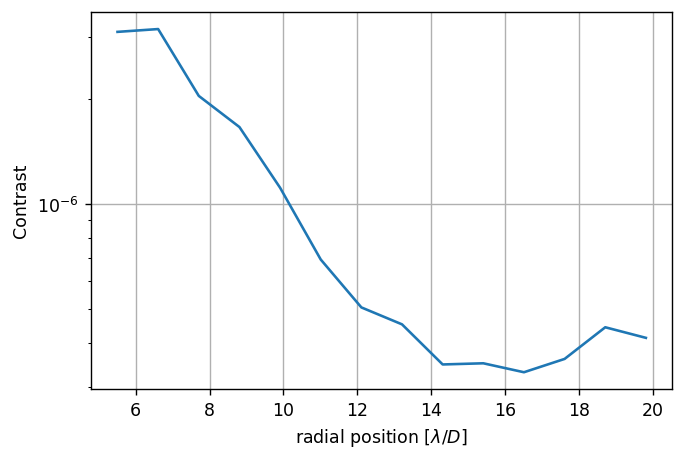

	Closed-loop iteration 18 / 20


(3672,)

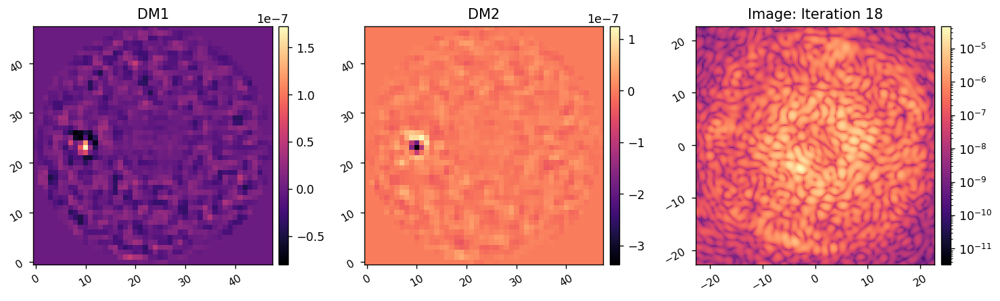

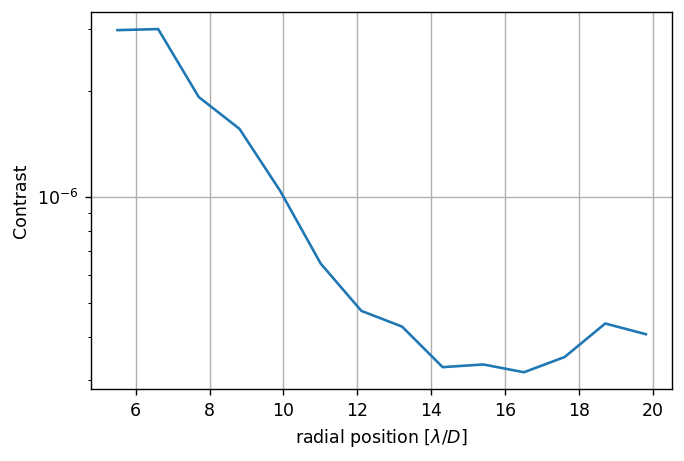

	Closed-loop iteration 19 / 20


(3672,)

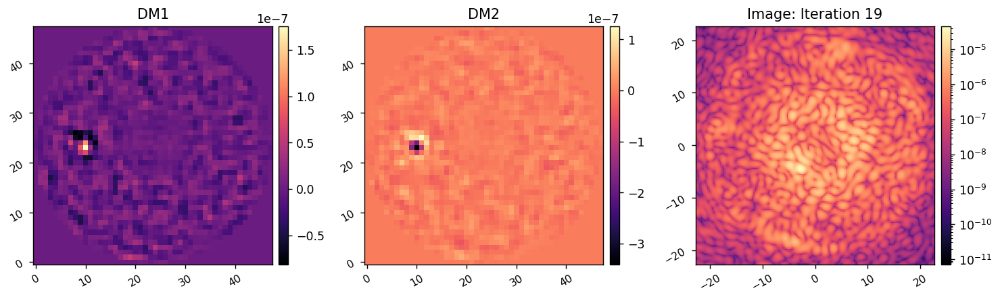

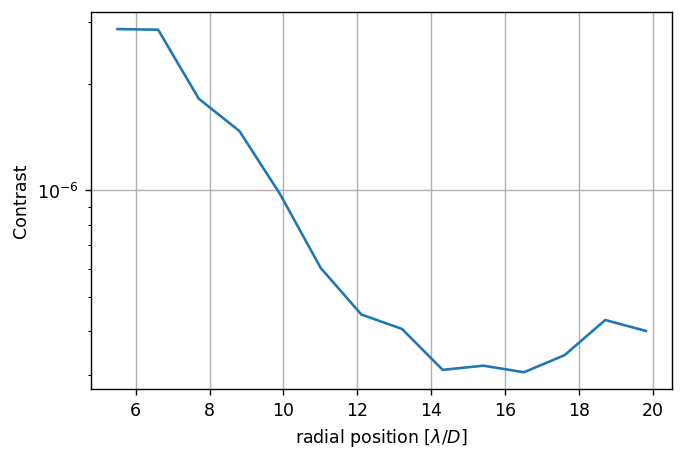

	Closed-loop iteration 20 / 20


(3672,)

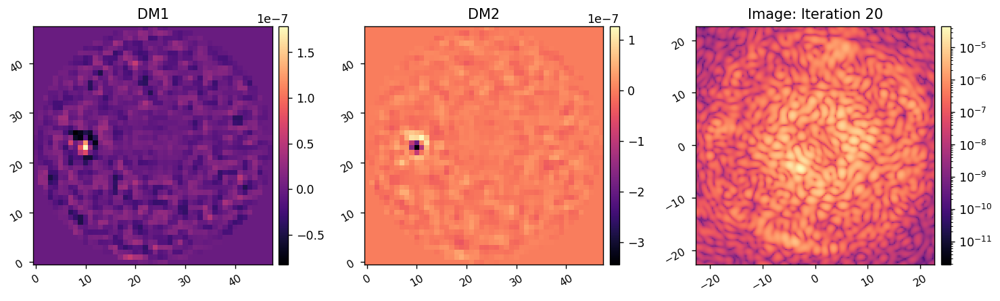

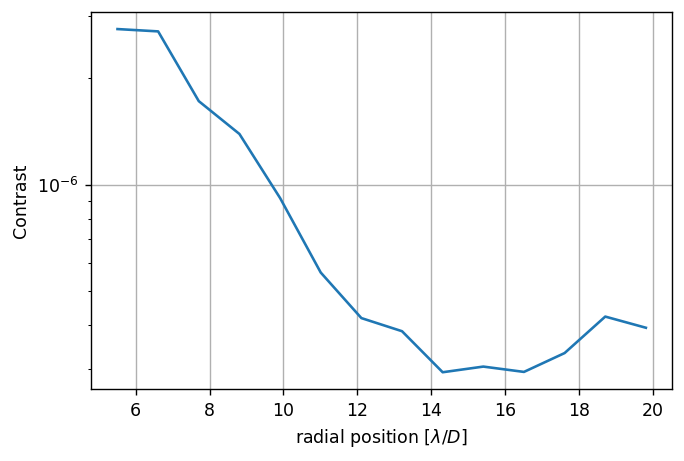

I-EFC loop completed in 54.452s.
Running I-EFC...
	Closed-loop iteration 1 / 20


(3672,)

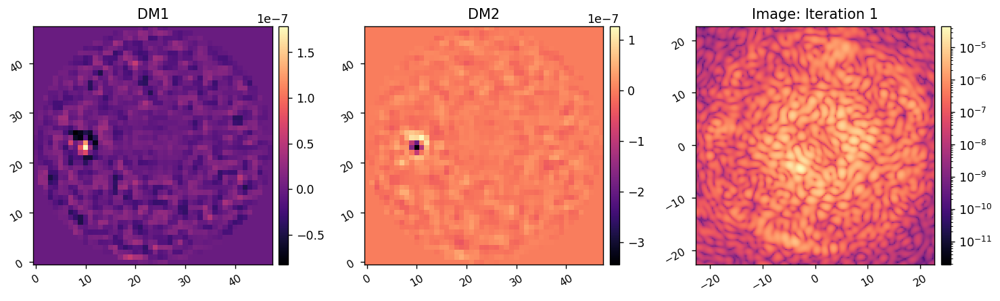

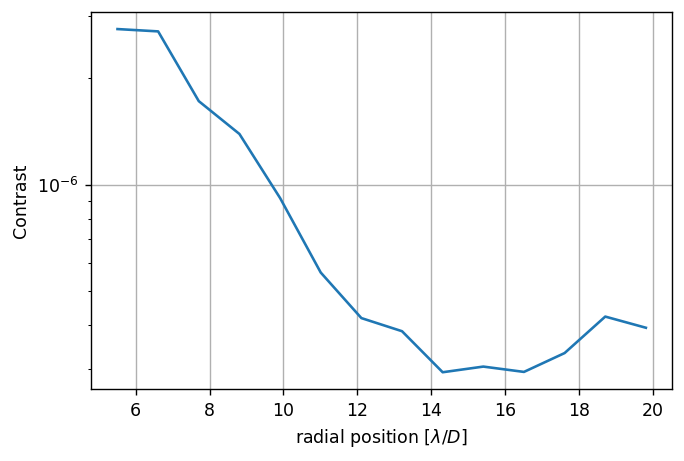

	Closed-loop iteration 2 / 20


(3672,)

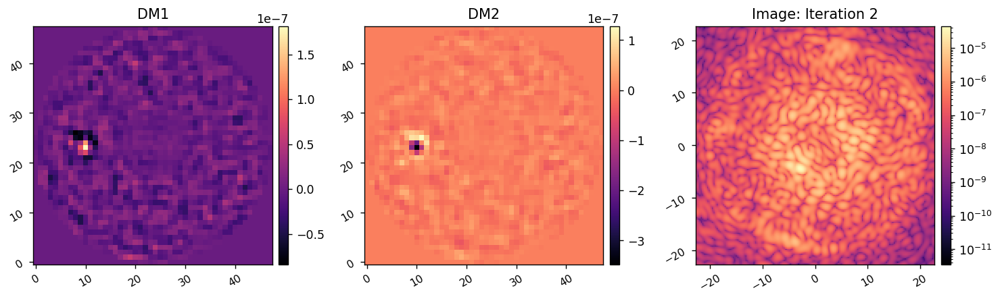

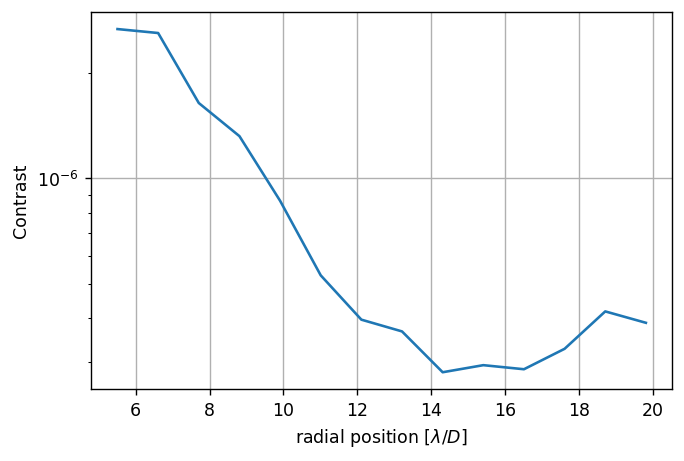

	Closed-loop iteration 3 / 20


(3672,)

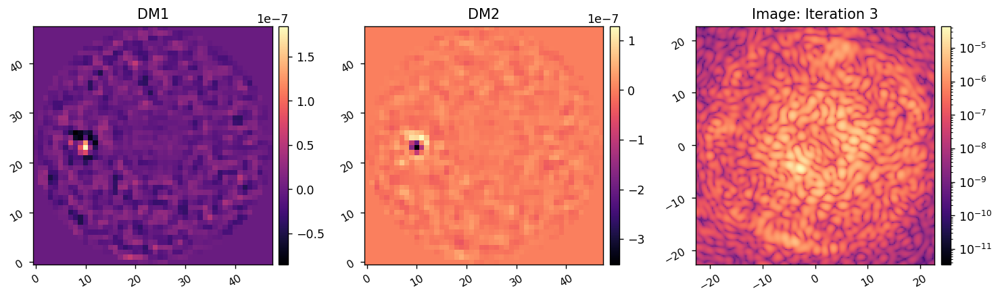

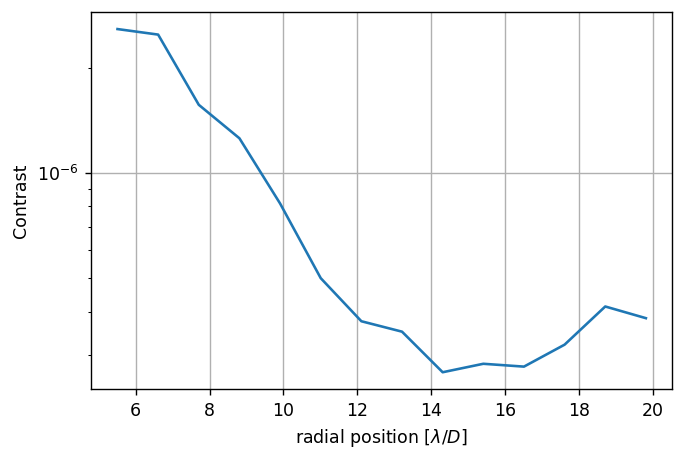

	Closed-loop iteration 4 / 20


(3672,)

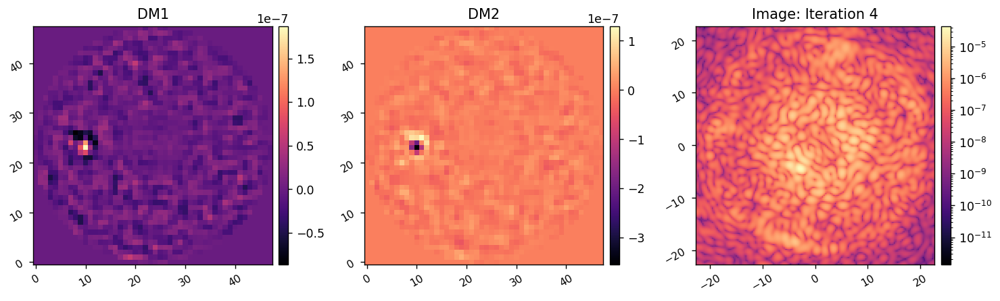

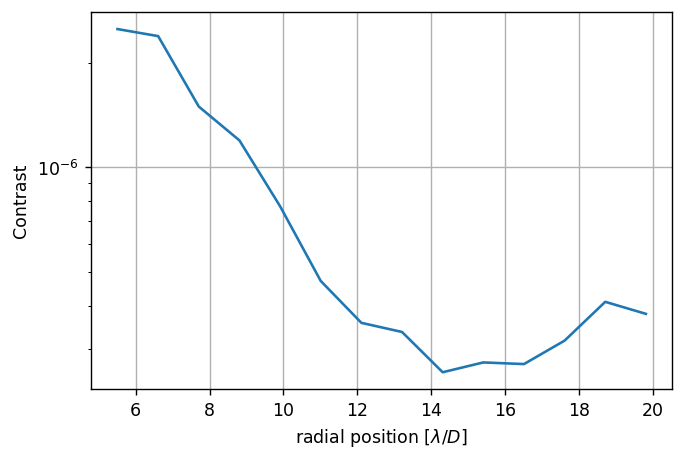

	Closed-loop iteration 5 / 20


(3672,)

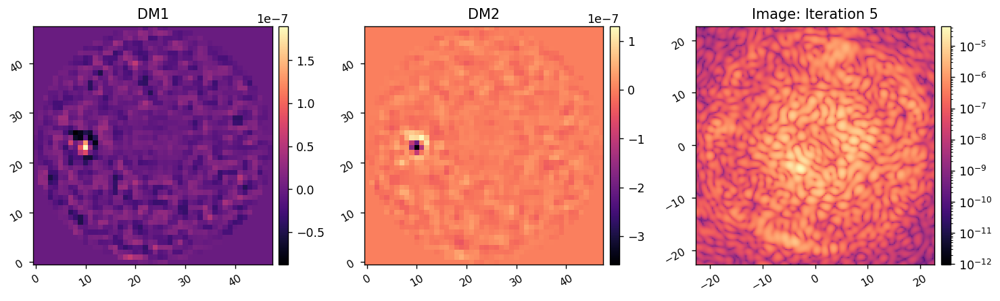

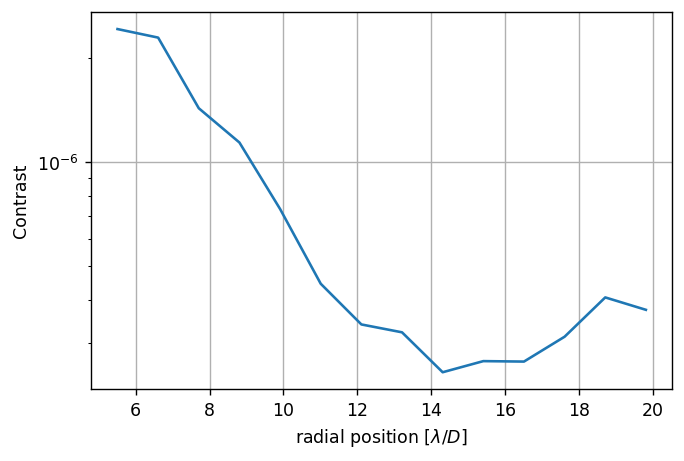

	Closed-loop iteration 6 / 20


(3672,)

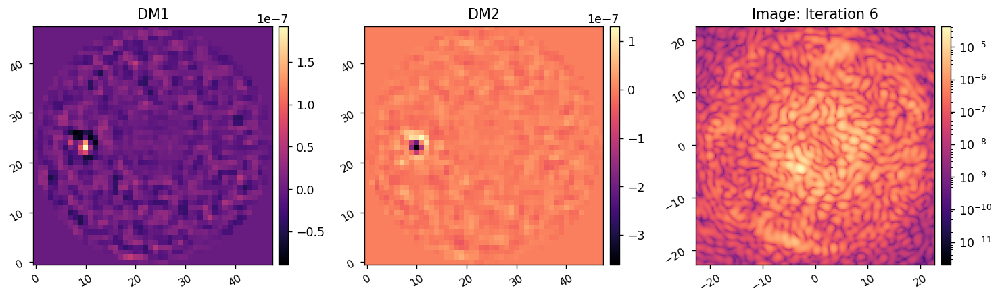

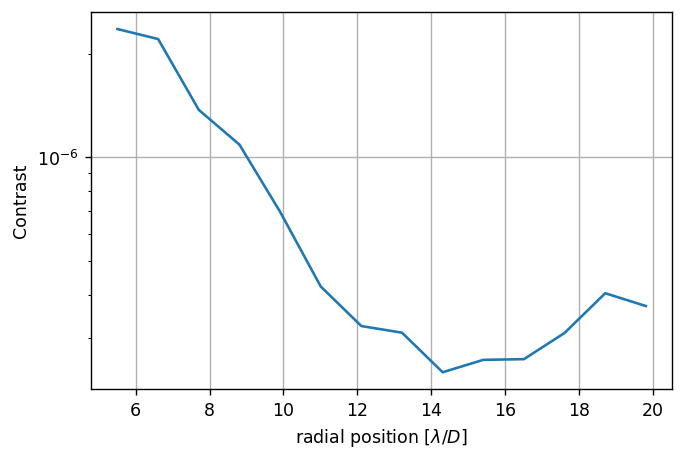

	Closed-loop iteration 7 / 20


(3672,)

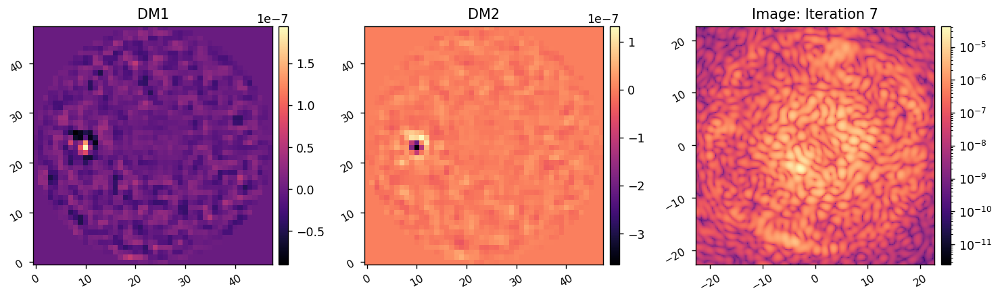

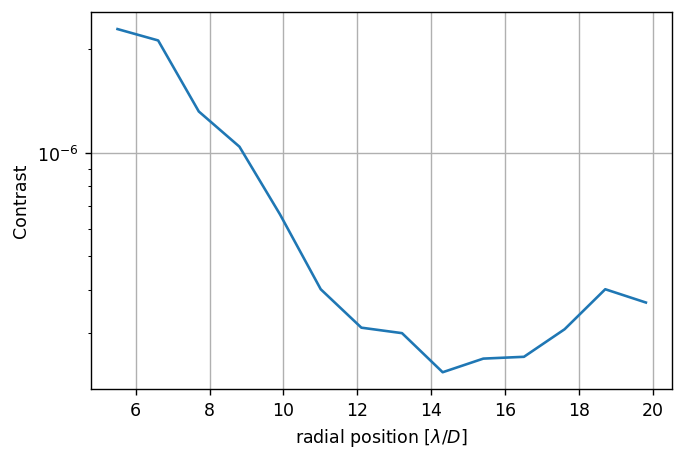

	Closed-loop iteration 8 / 20


(3672,)

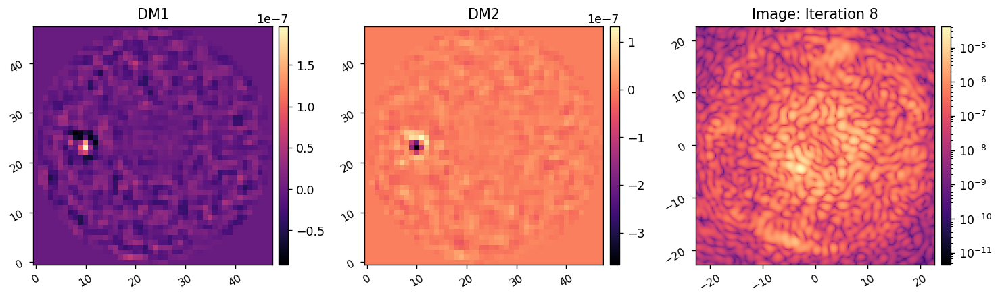

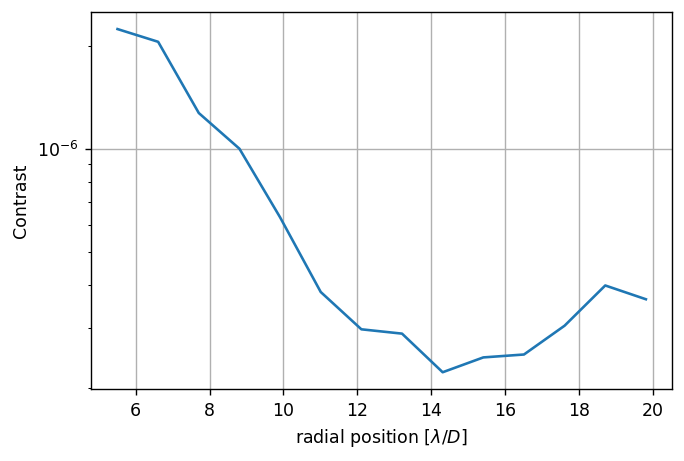

	Closed-loop iteration 9 / 20


(3672,)

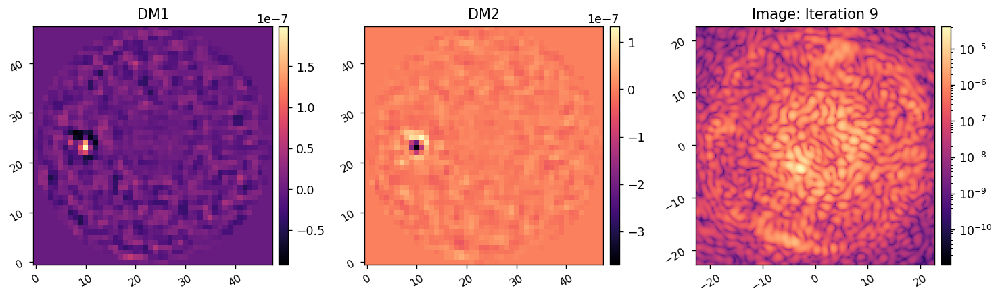

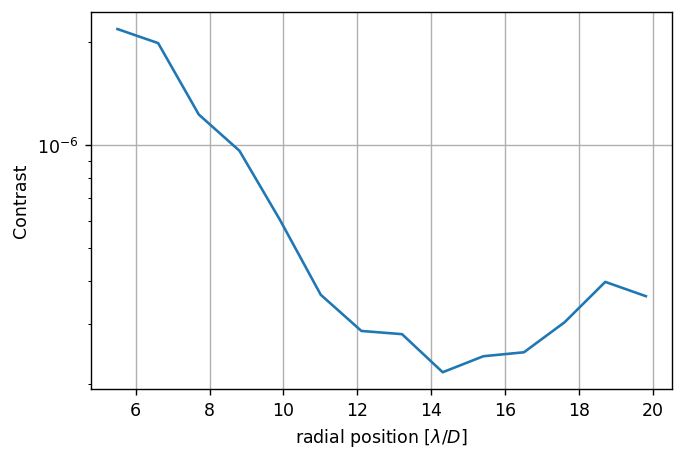

	Closed-loop iteration 10 / 20


(3672,)

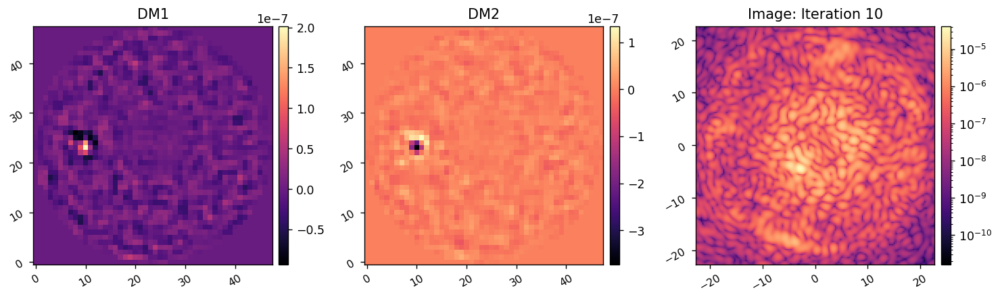

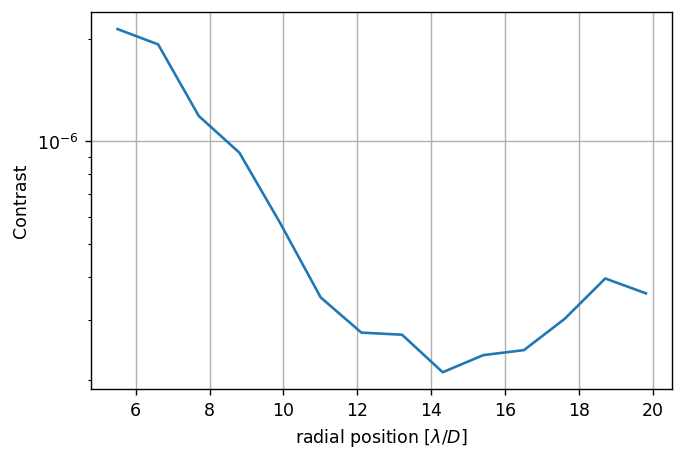

	Closed-loop iteration 11 / 20


(3672,)

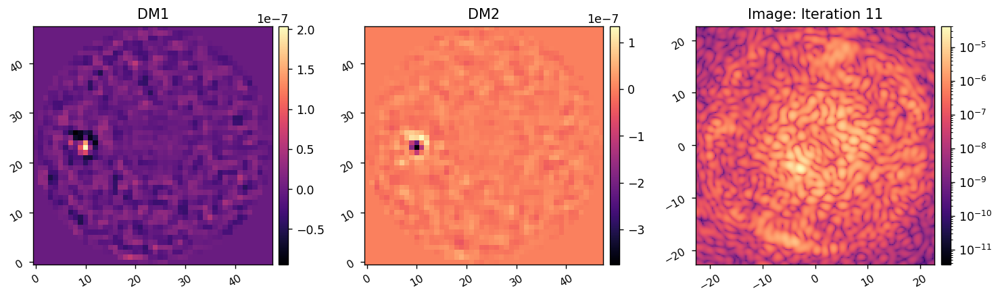

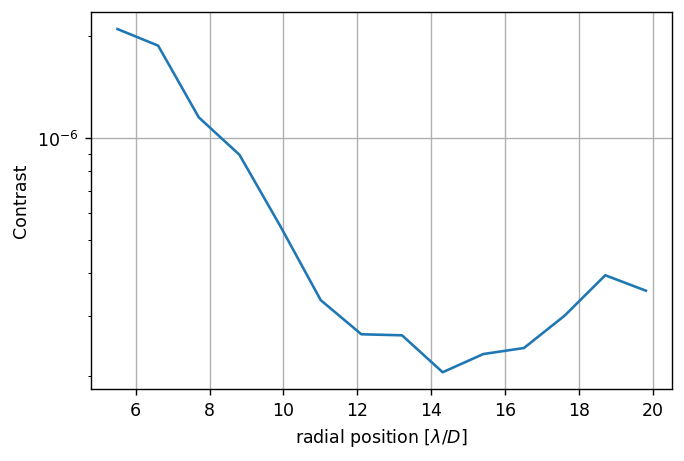

	Closed-loop iteration 12 / 20


(3672,)

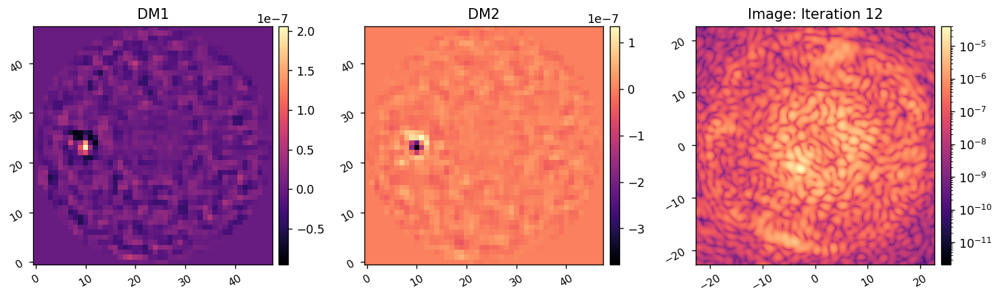

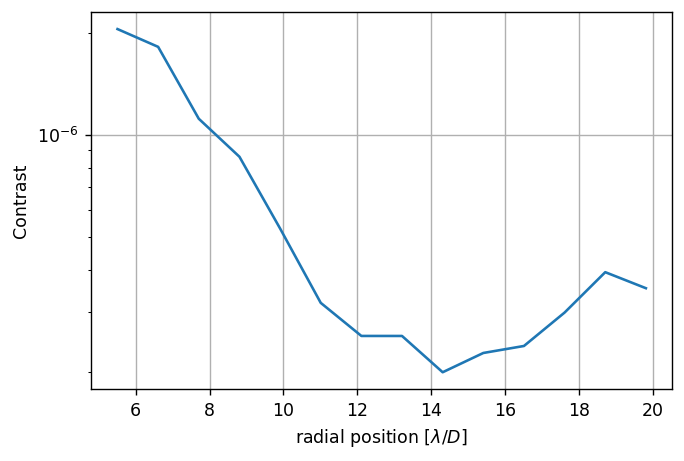

	Closed-loop iteration 13 / 20


(3672,)

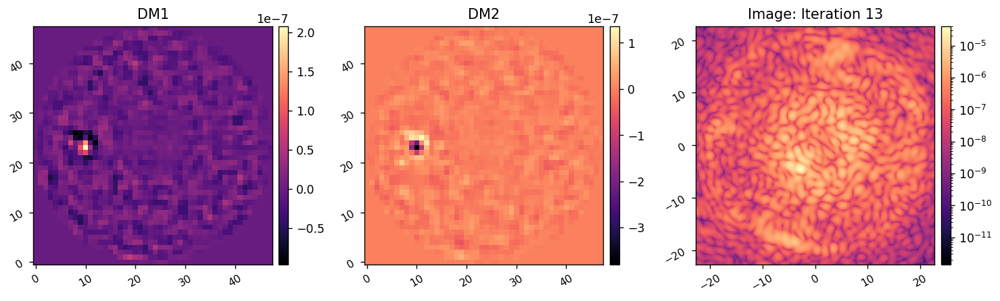

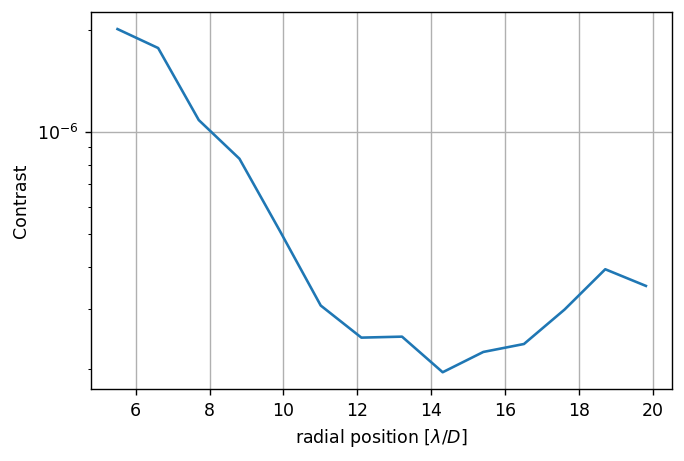

	Closed-loop iteration 14 / 20


(3672,)

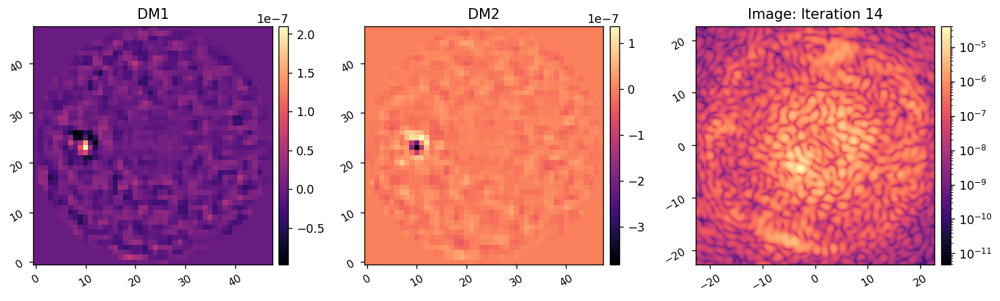

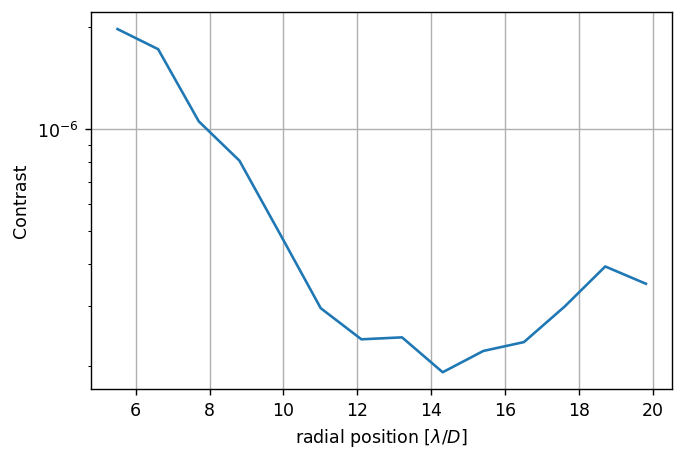

	Closed-loop iteration 15 / 20


(3672,)

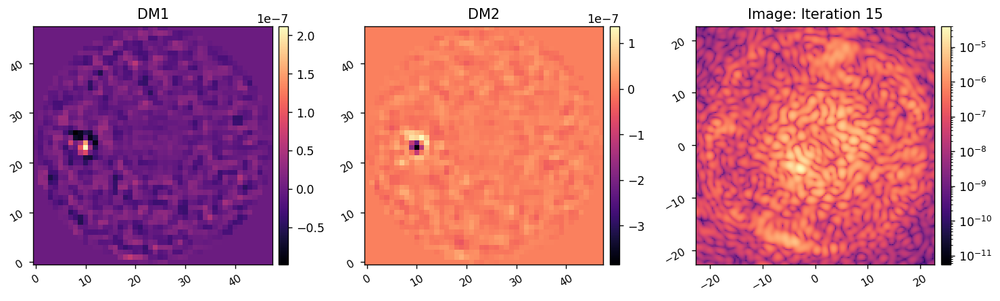

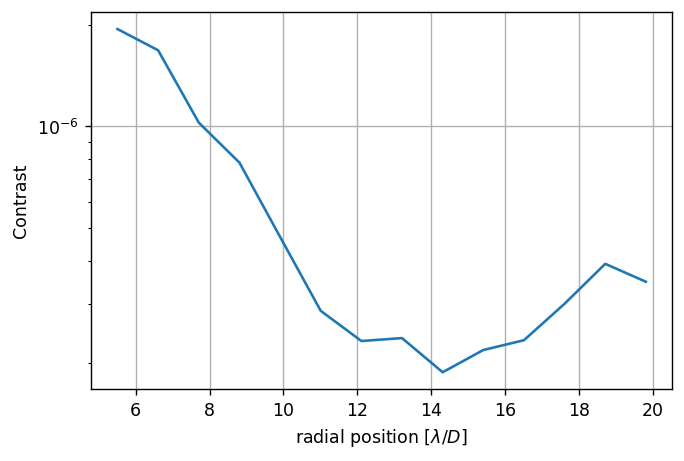

	Closed-loop iteration 16 / 20


(3672,)

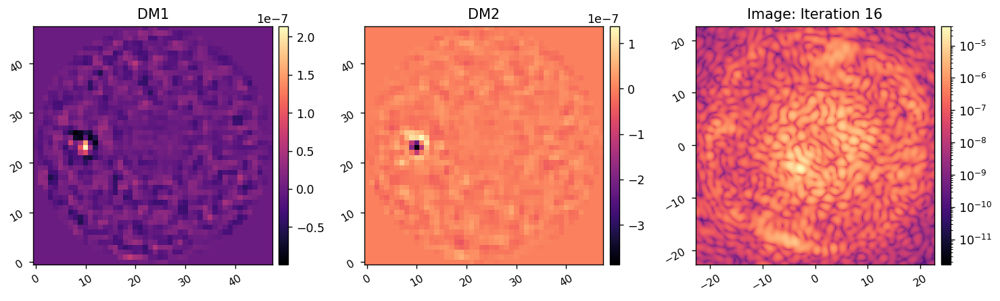

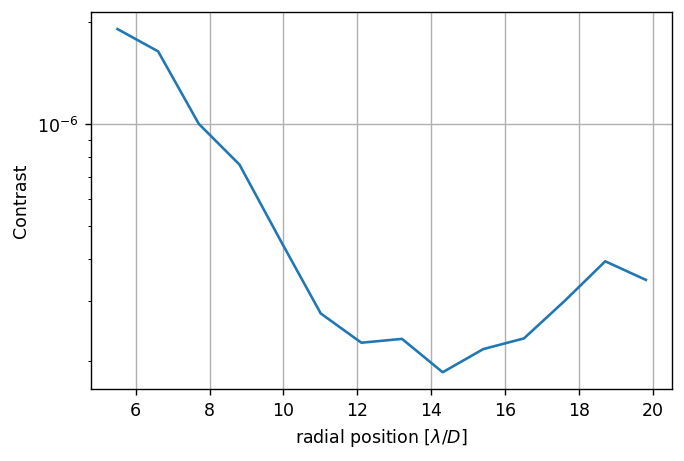

	Closed-loop iteration 17 / 20


(3672,)

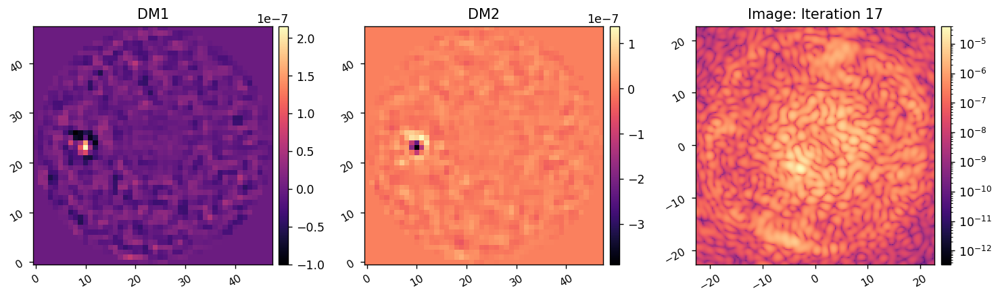

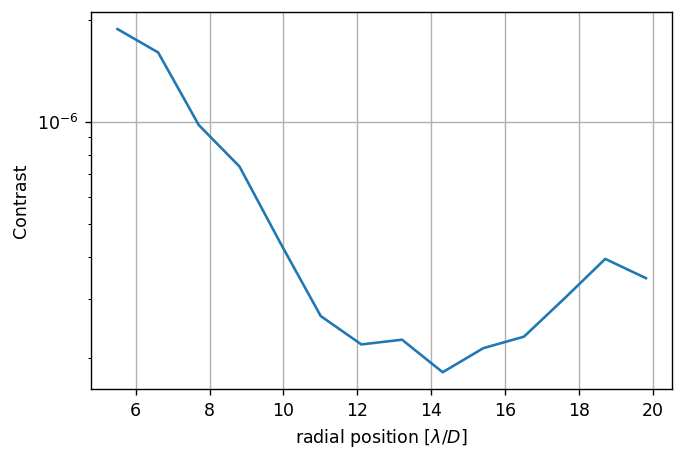

	Closed-loop iteration 18 / 20


(3672,)

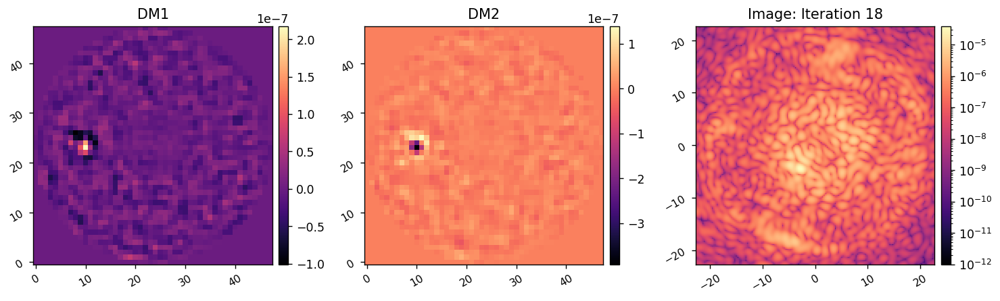

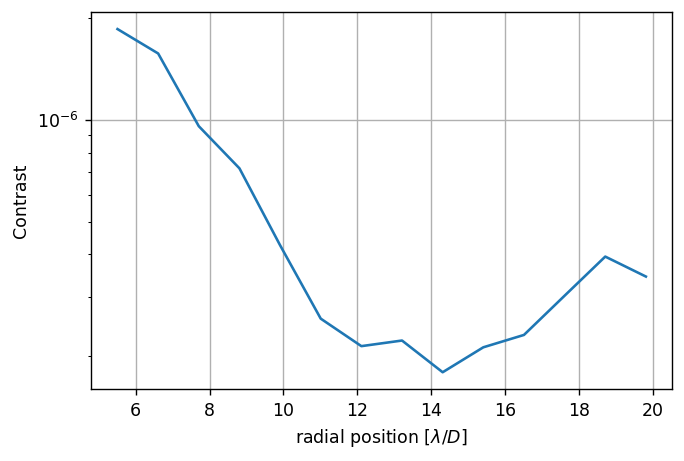

	Closed-loop iteration 19 / 20


(3672,)

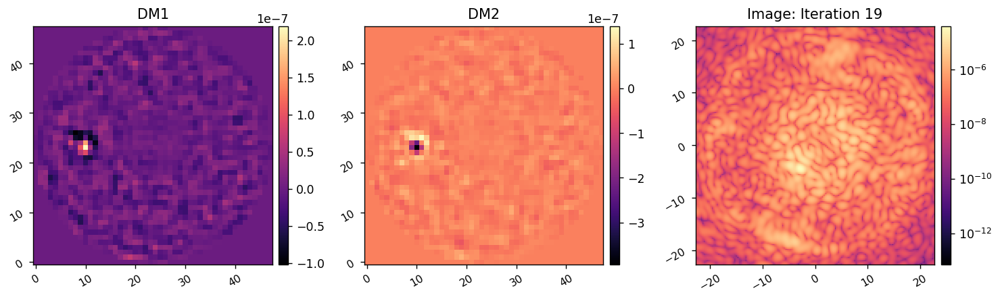

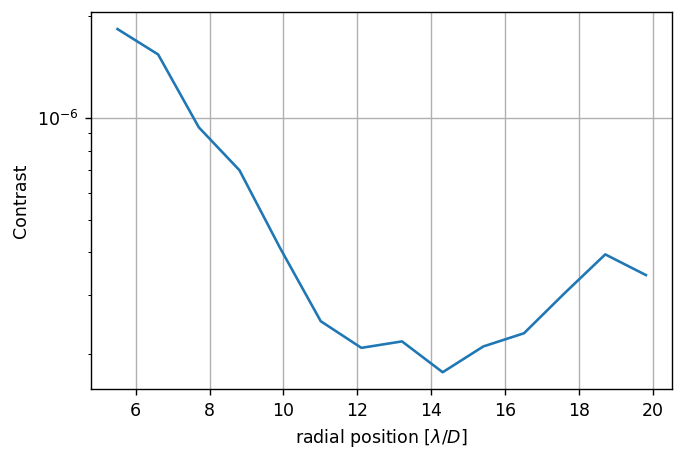

	Closed-loop iteration 20 / 20


(3672,)

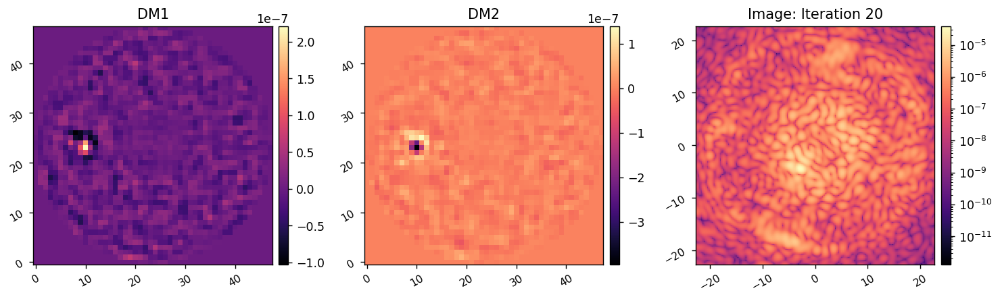

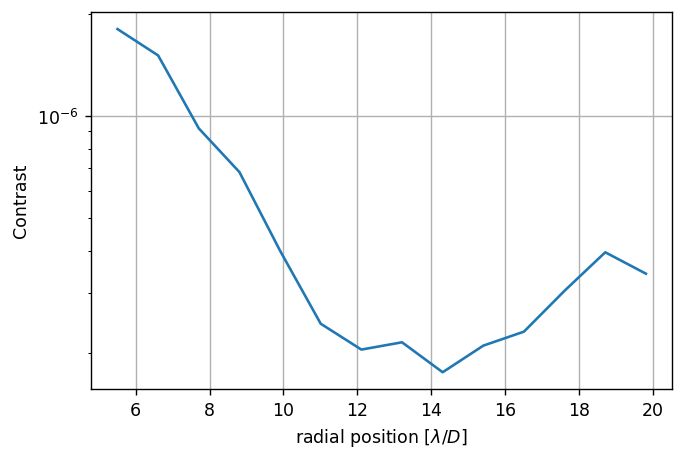

I-EFC loop completed in 54.097s.


In [18]:
reload(wfsc.iefc_2dm)
reload(wfsc.utils)

c.reset_dms()

reg_cond = 1e-2
reg_conds = [(1e-2,10), (1e-2, 20), (1e-3, 20)]

cm_tik = wfsc.utils.TikhonovInverse(response_matrix, rcond=reg_cond)
Wmatrix = np.diag(np.concatenate((weight_map[control_mask], weight_map[control_mask])))
cm_wls = wfsc.utils.WeightedLeastSquares(response_matrix, Wmatrix, rcond=reg_cond)

for i in range(len(reg_conds)):

    cm_wls = wfsc.utils.WeightedLeastSquares(response_matrix, Wmatrix, rcond=reg_conds[i][0])
    
    images, dm1_commands, dm2_commands = wfsc.iefc_2dm.run(c, 
                                              cm_tik,
                                              probe_modes, 
                                              probe_amp, 
                                              fourier_modes,
                                              control_mask, 
                                              num_iterations=reg_conds[i][1], 
                                              loop_gain=0.25, 
                                              leakage=0.0,
                                              plot_all=True,
                                             )

In [163]:
iefcu.save_pickle(data_dir/'image-results'/fname, images)
iefcu.save_pickle(data_dir/'dm-results'/fname, dm_commands)

Saved wavefronts to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/image-results/dshaped_Yopds_polaxis0_iwa3.0_owa6.0
Saved wavefronts to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/dm-results/dshaped_Yopds_polaxis0_iwa3.0_owa6.0
